# Spritz MBHB search + imputation (time-domain approach)

Let's try to  replicate `MBHB-search-dev-globe.ipynb` with time-domain data and with Spritz data (MBHB-1 dataset).

E Castelli - 2022

## Table of contents

0. Settings and package import
1. Load time-domain LDC data
2. Build orthogonal TDI combinations
3. Data pre-processing before gap-imputation
4. Gap imputation with custom gaps
    1. noise-only `n` data
    2. noise + signal `n + s` data
5. Analysis of Spritz data

## 0. Settings and package import

In [1]:
# Python standard packages
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
# from cycler import cycler
import scipy.signal
import h5py
import time
import sys
from pyfftw.interfaces.numpy_fft import fft, ifft
from scipy import interpolate
from scipy import optimize



In [2]:
# Custom LISA Data Analysis packages 
from ldc.lisa.noise import get_noise_model
from ldc.common.tools import window

import lisabeta.lisa.ldcnoise as ldcnoise
from bayesdawn import datamodel, psdmodel
import lisaorbits

MLDC modules could not be loaded.


In [3]:
# define function to print all attributes of hdf5 file recursively
def print_attrs(name, obj):
    shift = name.count('/') * '    '
    print(shift + name)
    for key, val in obj.attrs.items():
        print(shift + '    ' + f"{key}: {val}")

## 1. Load time-domain LDC data

We are currently interested only in the impact of gaps on the Spritz MBHB-1 dataset. In order to do that, we separate the effect of glitches from the effect of gaps in the Spritz data.

### 1.1. Download and access data

Download LDC 2b *Spritz* MBHB-1 data from the LDC official website (https://lisa-ldc.lal.in2p3.fr/challenge2b) and save them to the `./data/` folder.

In [4]:
# import data
fname = '../data/LDC2_spritz_mbhb1_training_v2.h5'
# open file with h5py
fid = h5py.File(fname)
# print all dataset attributes
# fid.visititems(print_attrs)
cfg = dict(zip(fid["obs/config"].keys(), [v[()] for v in fid["obs/config"].values()]))

#### 1.1. Import LDC data
Import the existing TDI datasets and build the missing TDI dataset

Existing:
- TDI dataset `obs` containing `noise + signal + artifacts` (gaps + glitches)
- TDI dataset `clean` containing `noise + signal`
- TDI dataset `sky` containing `signal`
- TDI dataset `noisefree` containing `signal + artifacts` (gaps + glitches)

Missing:
- TDI dataset containing `noise`
- TDI dataset containing `noise + signal + gaps`

In [5]:
from bayesdawn.connect.fillgaps import load_tdi_timeseries

In [6]:
tdidata = load_tdi_timeseries(fname = fname)

In [7]:
# set up dataset constant values
skip = 100 
# skipb = 100 
ndata = len(tdidata['obs'][skip:])
dt = tdidata['obs']['t'][1]-tdidata['obs']['t'][0]
fs = 1.0/dt
t_obs = ndata / fs

# print('skip','ndata','dt', 'fs',sep='\t',end='\n------------------------------\n')
# print(skip, ndata, dt, fs,sep='\t')

#### 1.3. Plot imported data:
- Datasets containing NO noise artifacts: `n+s`, `s`, `n`
- Dataset with artifacts: `n+s+g+gl`, `n+s+g`,`s+g+gl`
    
Useful LDC-provided resources and code bits to importing Spritz data taken from here: https://gitlab.in2p3.fr/LISA/LDC/-/blob/develop/notebooks/LDC2b-Spritz.ipynb

In [8]:
# avgwin = 'nuttall'
avgwin = 'hann'

Text(0.5, 0.98, 'TDI X time-series and noise spectra')

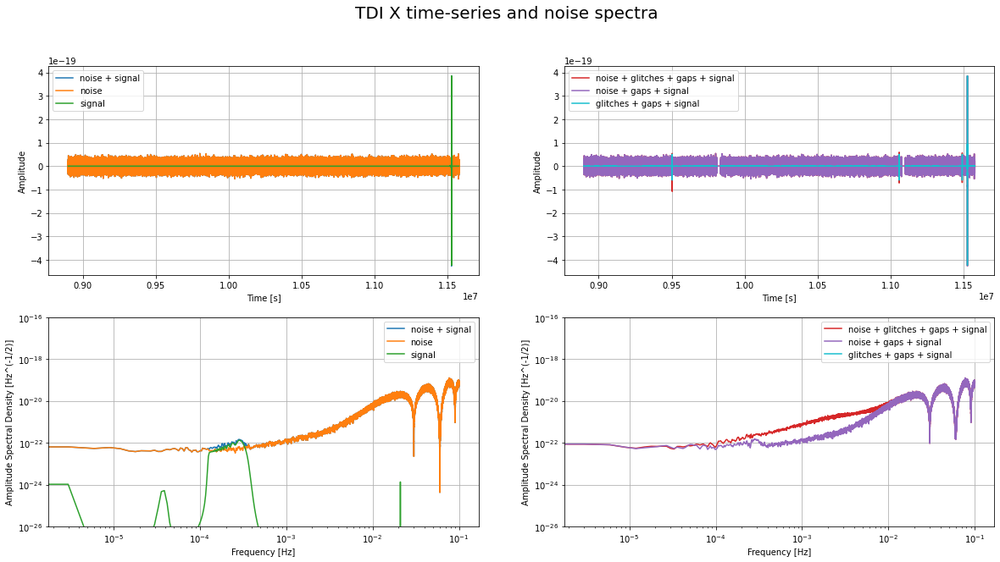

In [9]:
# plot TDI X time-series and noise spectra for all different configurations
nperseg=ndata//8
fig, ax = plt.subplots(2, 2, figsize=(20,10))
# top left canvas
ax[0][0].plot(tdidata['clean']['t'][skip:], tdidata['clean']["X"][skip:], label = 'noise + signal')
ax[0][0].plot(tdidata['noise']['t'][skip:], tdidata['noise']["X"][skip:], label='noise')
ax[0][0].plot(tdidata['sky']['t'][skip:], tdidata['sky']["X"][skip:], label='signal')
ax[0][0].set_ylabel("Amplitude")
ax[0][0].set_xlabel("Time [s]")
ax[0][0].grid()
ax[0][0].legend()
# top right canvas
ax[0][1].plot(tdidata['obs']['t'][skip:], tdidata['obs']["X"][skip:], label='noise + glitches + gaps + signal', color='tab:red')
ax[0][1].plot(tdidata['clean_gapped']['t'][skip:], tdidata['clean_gapped']["X"][skip:], label='noise + gaps + signal', color='tab:purple')
ax[0][1].plot(tdidata['noisefree']['t'][skip:], tdidata['noisefree']["X"][skip:], label='glitches + gaps + signal', color='tab:cyan')
ax[0][1].set_ylabel("Amplitude")
ax[0][1].set_xlabel("Time [s]")
ax[0][1].grid()
ax[0][1].legend()
# bottom left canvas
f, psdX =  scipy.signal.welch(tdidata['clean']["X"][skip:], fs=1.0/dt, window=avgwin, nperseg=nperseg)
ax[1][0].loglog(f, np.sqrt(psdX),label = 'noise + signal')
f, psdX =  scipy.signal.welch(tdidata['noise']["X"][skip:], fs=1.0/dt, window=avgwin, nperseg=nperseg)
ax[1][0].loglog(f, np.sqrt(psdX),label = 'noise')
f, psdX =  scipy.signal.welch(tdidata['sky']["X"][skip:], fs=1.0/dt, window=avgwin, nperseg=nperseg)
ax[1][0].loglog(f, np.sqrt(psdX),label = 'signal')
ax[1][0].set_ylabel("Amplitude Spectral Density [Hz^(-1/2)]")
ax[1][0].set_xlabel("Frequency [Hz]")
ax[1][0].grid()
ax[1][0].legend()
ax[1][0].set_ylim([1e-26,1e-16])
# ax[1][0].set_xlim([2e-5,0.3])

# bottom right canvas
tdix_wo_nan = tdidata['obs']["X"].copy()
tdix_wo_nan[np.isnan(tdidata['obs']['X'])] = 0 # set to 0 to compute PSD
f, psdX =  scipy.signal.welch(tdix_wo_nan[skip:], fs=1.0/dt, window=avgwin, nperseg=nperseg)
ax[1][1].loglog(f, np.sqrt(psdX),label = 'noise + glitches + gaps + signal', color='tab:red')

tdigapped_wo_nan = tdidata['clean_gapped']["X"].copy()
tdigapped_wo_nan[np.isnan(tdidata['obs']['X'])] = 0 # set to 0 to compute PSD
f, psdX =  scipy.signal.welch(tdigapped_wo_nan[skip:], fs=1.0/dt, window=avgwin, nperseg=nperseg)
ax[1][1].loglog(f, np.sqrt(psdX),label = 'noise + gaps + signal', color='tab:purple')

tdinoise_wo_nan = tdidata['noisefree']["X"].copy()
tdinoise_wo_nan[np.isnan(tdidata['obs']['X'])] = 0 # set to 0 to compute PSD
f, psdX =  scipy.signal.welch(tdinoise_wo_nan[skip:], fs=1.0/dt, window=avgwin, nperseg=nperseg)
ax[1][1].loglog(f, np.sqrt(psdX),label = 'glitches + gaps + signal', color='tab:cyan')

ax[1][1].set_ylabel("Amplitude Spectral Density [Hz^(-1/2)]")
ax[1][1].set_xlabel("Frequency [Hz]")
ax[1][1].grid()
ax[1][1].legend()
ax[1][1].set_ylim([1e-26,1e-16])
# ax[1][1].set_xlim([2e-5,0.3])

plt.suptitle('TDI X time-series and noise spectra',fontsize=20)
# fig.tight_layout()

## 2. Build orthogonal TDI combinations

### 2.1. Build orthogonal TDI combinations for `n+s` data. 

Check that explicit evaluation of orthogonal TDI combinations is equivalent to evaluation inside LDC functions.

In [10]:
from bayesdawn.connect.fillgaps import build_orthogonal_tdi

In [11]:
datans = build_orthogonal_tdi(tdidata['clean'])

Compare my evaluation to LDC conversion function, just to be on the safe side of things.

### 2.2. Build orthogonal TDI combinations for `s`, `n`, `n+s+g` data. 


In [12]:
datas  = build_orthogonal_tdi(tdidata['sky'])
datan  = build_orthogonal_tdi(tdidata['noise'])
datag  = build_orthogonal_tdi(tdidata['clean_gapped'])
datang = build_orthogonal_tdi(tdidata['noise_gapped'])
dataobs = build_orthogonal_tdi(tdidata['obs'])

### 2.3. Define useful functions 

All these will end up in a separate file afterwards.

- `fft_olap_psd`: function that evaluates PSD equivalent to `scipy.signal.welch` and also evaluates FFT at the same time
- `generate_freq_data`: function that applies `fft_olap_psd` to each group inside data and groups results in a single `numpy.recarray` with the same structure of time-domain data.
- `plot_compare_spectra_timeseries`: modified version of `lisabeta_fill_gaps.plot_compare_spectra` function that plots noise spectra and distribution of real/imag part of PSD/noise_model

### 2.4 Data quicklook
#### 2.4.1 Test PSD and FFT evaluation function

In [13]:
from bayesdawn.connect.fillgaps import fft_olap_psd, generate_freq_data, plot_compare_spectra_timeseries

#### 2.4.2 Define LISA noise model
Import noise model for Spritz data from LDC toolbox.

In [14]:
cfg['dt_orbits'], cfg['nominal_arm_length'], cfg['kepler_order']

(86400.0, 2500000000.0, 2)

/Users/ecastel2/Documents/LISA/research/GSFC/gap-filling/code/gap-venv/lib/python3.10/site-packages/matplotlib/cbook/__init__.py:1298: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


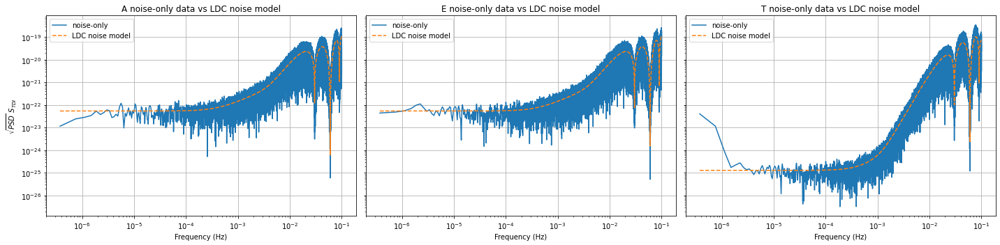

In [15]:
#Load some noise models from lisabeta
# import lisabeta.lisa.pyLISAnoise as pyLISAnoise

LISAnoise={'InstrumentalNoise': 'SciRDv1', 
           'WDbackground': False, 
           'WDduration': 0.0, 
           'lowf_add_pm_noise_f0': 0.0, 
           'lowf_add_pm_noise_alpha': 2.0}
# LISAnoise={'InstrumentalNoise': 'Proposal', 
#            'WDbackground': True, 
#            'WDduration': 3.0, 
#            'lowf_add_pm_noise_f0': 0.0, 
#            'lowf_add_pm_noise_alpha': 2.0}

# eval psd of noise data
fdatan, psddatan, fftscalefac = generate_freq_data(datan)
# noise models for A, E, T
 # Comparison with LISA Orbits
orbits = lisaorbits.KeplerianOrbits(dt=cfg['dt_orbits'], 
                                    L=cfg['nominal_arm_length'], 
                                    a=149597870700.0, 
                                    lambda1=0, 
                                    m_init1=0, 
                                    kepler_order=cfg['kepler_order'])
noise_model = "spritz"
S = {}
Nmodel = get_noise_model(noise_model, fdatan['f'], wd=0, orbits=orbits, t_obs=ndata*dt)
for tdi in ['A', 'E', 'T']:
    S[tdi] = Nmodel.psd(tdi2=True, option=tdi, freq=fdatan['f'], equal_arms=False)
# plot data
fig, ax = plt.subplots(1,3,figsize=(20,5),sharey=True)
for tdi in S.keys(): 
    ax[list(S.keys()).index(tdi)].set_title('{tdi} noise-only data vs LDC noise model'.format(tdi=tdi))
    ax[list(S.keys()).index(tdi)].loglog(fdatan['f'], np.sqrt(psddatan[tdi]), label='noise-only')
    ax[list(S.keys()).index(tdi)].loglog(fdatan['f'], np.sqrt(S[tdi]), ls='--', label='LDC noise model')
    ax[list(S.keys()).index(tdi)].set_xlabel('Frequency (Hz)')
    ax[list(S.keys()).index(tdi)].grid()
    ax[list(S.keys()).index(tdi)].legend()

ax[0].set_ylabel(r'$\sqrt{PSD}$ $S_{TDI}$')
fig.tight_layout()
# plt.suptitle('Comparison between TDI of noise-only Spritz data vs noise models');

#### 2.4.3 Plot comparison between spectra and FFT distribution

/Users/ecastel2/Documents/LISA/research/GSFC/gap-filling/code/gap-venv/lib/python3.10/site-packages/numpy/lib/histograms.py:852: ComplexWarning: Casting complex values to real discards the imaginary part
  indices = f_indices.astype(np.intp)
/Users/ecastel2/Documents/LISA/research/GSFC/gap-filling/code/gap-venv/lib/python3.10/site-packages/numpy/lib/histograms.py:905: ComplexWarning: Casting complex values to real discards the imaginary part
  db = np.array(np.diff(bin_edges), float)
/Users/ecastel2/Documents/LISA/research/GSFC/gap-filling/code/gap-venv/lib/python3.10/site-packages/matplotlib/transforms.py:775: ComplexWarning: Casting complex values to real discards the imaginary part
  points = np.asarray(points, float)


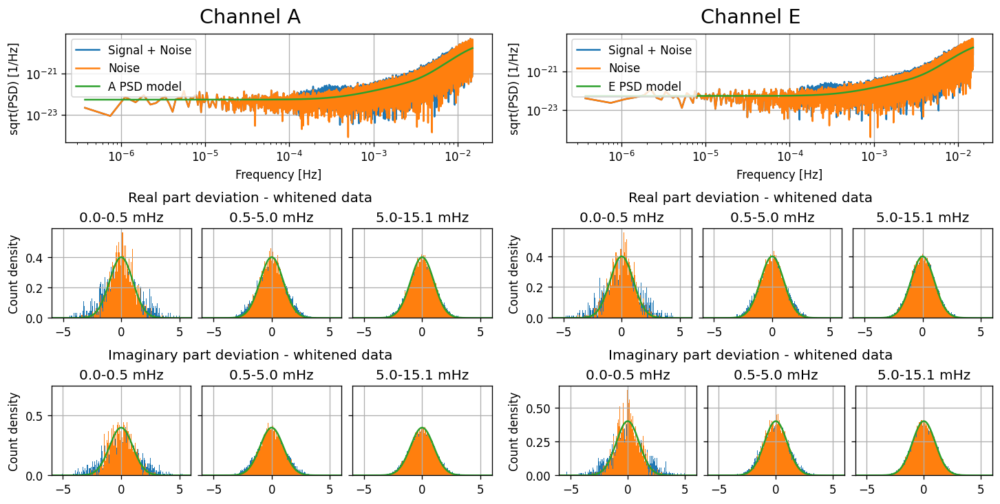

In [16]:
fmax = 1.51e-2
plot_compare_spectra_timeseries(data = [datans, datan], 
                                freq_bands=[5e-4, 5e-3],
                                fmax = fmax)

## 3. Spritz data gaps in noise only data `n + g`

In [17]:
# import lisabeta_fill_gaps as fill_gaps
from bayesdawn.connect.fillgaps import construct_gap_mask

Here we compare the full noise + signal dataset with the only-noise dataset, applying `LISAnoise` as noise model for the TDI noise spectra.

We'll first apply imputation to noise-only `n` data in the `datan` dataset.

For gapped data we'll be using the `datang` dataset, containing the Sprtiz noise-only data with gaps `n + g`.


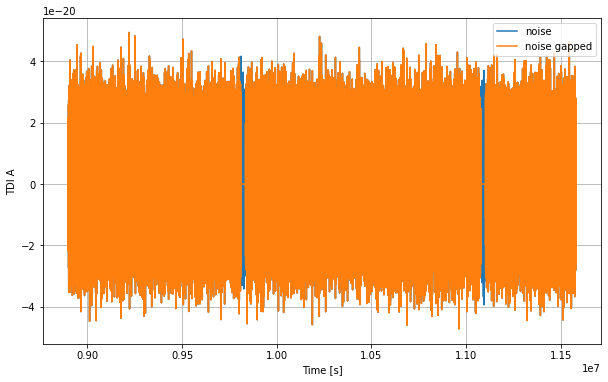

In [18]:
# compare noise full data and noise gapped data
fig, ax = plt.subplots(1, 1, figsize=(10,6))
# top left canvas
ax.plot(datan['t'], datan['A'], label='noise')
ax.plot(datang['t'], datang['A'], label='noise gapped')
ax.set_xlabel('Time [s]')
ax.set_ylabel('TDI A')
ax.grid()
ax.legend()

In [19]:
# reset time-series information data
ndata = datang.shape[0]
dt = datang['t'][1]-datang['t'][0]
fs = 1/(datang['t'][1]-datang['t'][0])

print('ndata','dt', 'fs',sep='\t',end='\n---------------------\n')
print(ndata, dt, fs,sep='\t')

fdatan, psddatan, fftscalefac = generate_freq_data(datan)
fdatang, psddatang, fftscalefac = generate_freq_data(datang)

ndata	dt	fs
---------------------
535580	5.0	0.2


### 3.1 Set up PSD Spritz noise model

We'll end up not using this noise model in the gap imputation, but this might be useful for other purposes (or once the Spritz noise model is fixed).

In [20]:
from bayesdawn.connect.fillgaps import LDCModelPSD

Let's take a look at the model w.r.t downaveraged data.

We also need to generate the Spritz gap mask.

In [21]:
from bayesdawn.connect.fillgaps import get_ldc_gap_mask

In [22]:
mask = np.ones(datang.shape[0])
ndata = datang.shape[0]

spritzgaps = get_ldc_gap_mask(dataobs, mode='index')
gapstarts,gapends= np.vsplit(spritzgaps, 2)

for k in range(gapstarts.shape[1]):
    mask[gapstarts.reshape((2))[k]:gapends.reshape((2))[k]]=0

spritzmask = {'mask': mask,
              'starts': gapstarts.reshape((2)),
              'ends': gapends.reshape((2))}

figname = 'figures/nodownavg_spritzgaps'

Text(0, 0.5, 'Spritz gap mask')

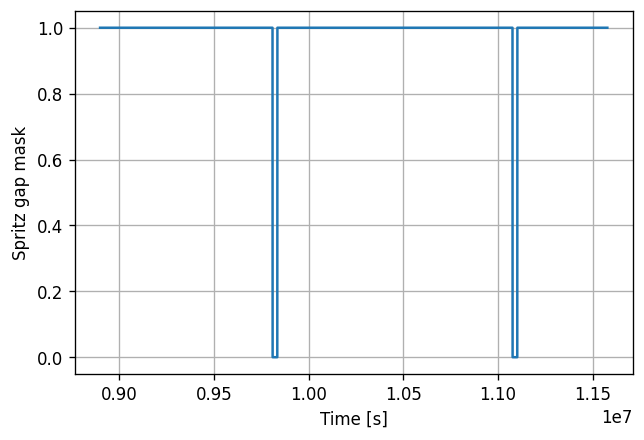

In [23]:
fig,ax = plt.subplots(1,1,dpi=120)
# ax.plot(maskinfo['mask'])
ax.plot(datan['t'],spritzmask['mask'])
ax.grid()
ax.set_xlabel('Time [s]')
ax.set_ylabel('Spritz gap mask')

### 3.2 Visualize gaps in time-domain

Slightly modified version of `lisabeta_fill_gaps.view_gaps`.

In [24]:
from bayesdawn.connect.fillgaps import view_gaps

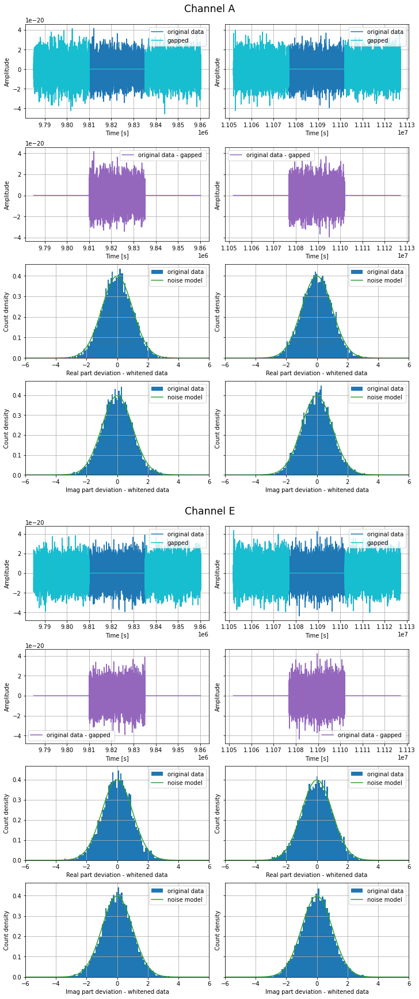

In [25]:
view_gaps(ts = datan['t'],
          ys = [[datan[names] for names in datan.dtype.names[1:]]],
          yg = [datang[names] for names in datang.dtype.names[1:]],
          maskinfo = spritzmask, channels = ['A', 'E'],
          labels=['original data'], nwing = 5000, histogram=True)

### 3.3 Set up LDC noise model for PSD

In [26]:
# Embed the PSD function in a class
# psdmodel is imported from bayesdawn
class LDCModelPSD0(psdmodel.PSD):
    '''
    Specialization of the bayesdawn psd model class which connects LDC noise models to lisabeta PSD models.
    
    Parameters
    ----------
    n_data : array_like
        vector of size N_DSP continaing the noise DSP calculated at frequencies
        between -fe/N_DSP and fe/N_DSP where fe is the sampling frequency and N
        is the size of the time series (it will be the size of the returned
        temporal noise vector b)
    fs : scalar integer
        Size of the output time series
    noise_model : scalar float
        sampling frequency
    channel : string
        seed of the random number generator

    Returns
    -------
        bf : numpy array
        frequency sample of the colored noise (size N)
    '''

    def __init__(self, ndata, fs, noise_model, channel, fmin=None, fmax=None, config = cfg):
        # instantiates the PDS estimator from function psdmodel.PSD
        self.noise_model = noise_model
        self.channel = channel
        psdmodel.PSD.__init__(self, ndata, fs, fmin=None, fmax=None)
        if fmax is not None:
            self.f = self.f[self.f<fmax]

    def psd_fn(self, x):
        # returns the psd function defined earlier
        tobs = ndata / fs
        orbits = lisaorbits.KeplerianOrbits(dt=cfg['dt_orbits'], 
                                    L=cfg['nominal_arm_length'], 
                                    a=149597870700.0, 
                                    lambda1=0, 
                                    m_init1=0, 
                                    kepler_order=cfg['kepler_order']) 
        
        Nmodel = get_noise_model(self.noise_model, x, wd=0, orbits=orbits, t_obs=tobs)
        return Nmodel.psd(tdi2=True, option=self.channel, freq=x, equal_arms=False)

## 4. Perform data imputation with only LDC noise model

In [27]:
from bayesdawn.connect.fillgaps import create_imputation, update_imputation

In [28]:
# create empty arrays for the imputation
imp_cls = []
psd_cls = []
y_res = []

names=['A', 'E', 'T']
# set up flags and variables
mask = spritzmask['mask']
datang_rec = datang.copy()

/Users/ecastel2/Documents/LISA/research/GSFC/gap-filling/code/gap-venv/lib/python3.10/site-packages/bayesdawn-0.1.0-py3.10.egg/bayesdawn/datamodel.py:340: UserWarning: The maximum size of gap + conditional is high.


Computation of autocovariance + PSD took 8.278012037277222
Imputation for combination A took 8.487140893936157
Computation of autocovariance + PSD took 6.6613450050354
Imputation for combination E took 6.918478727340698
Computation of autocovariance + PSD took 6.438058853149414
Imputation for combination T took 6.542139053344727


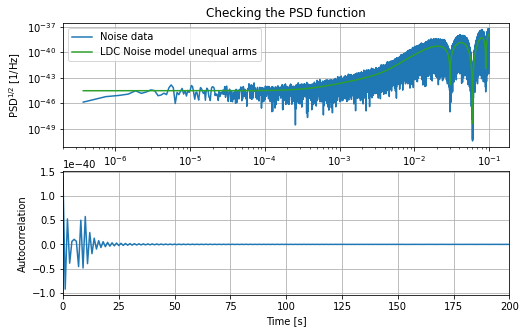

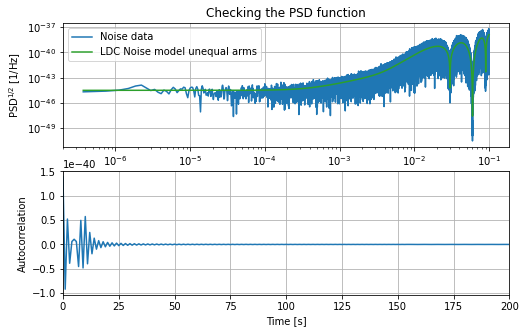

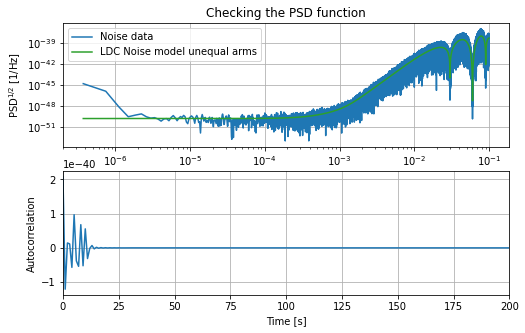

In [29]:
# Perform data imputation WITHOUT loop
### NB this can be streamlined a little bit more and/or transformed into a function 
for tdi in names:
    t1 = time.time()
    psd_cls, imp_cls, y_res = create_imputation(datang, tdi, mask, noise_model = 'spritz')
    datang_rec[tdi] = y_res
    t2 = time.time()
    print("Imputation for combination " + tdi + " took " + str(t2-t1))
    # Plot data against PSD
    fig, ax = plt.subplots(2, 1, figsize=(8,5))
    ax[0].set_title(r"Checking the PSD function")
    ax[0].set_xlabel(r"Frequency [Hz]")
    ax[0].set_ylabel(r"PSD${}^{1/2}$ [1/Hz]") 
    ax[0].loglog(psddatan['f'], (psddatan[tdi]), label="Noise data")
    ax[0].loglog(psddatan['f'], psd_cls.psd_fn(psddatan['f']), label="LDC Noise model unequal arms", color='tab:green')
    # ax.loglog(psddatang['f'], (psddatang['A']), label="Noise")
    ax[0].grid()
    ax[0].legend()
    # look at the psd autocorrelation to assess the width of the nearest region
    ax[1].plot(psd_cls.calculate_autocorr(ndata))
    ax[1].grid()
    ax[1].set_xlabel('Time [s]')
    ax[1].set_ylabel('Autocorrelation')
    ax[1].set_xlim([0, 200])

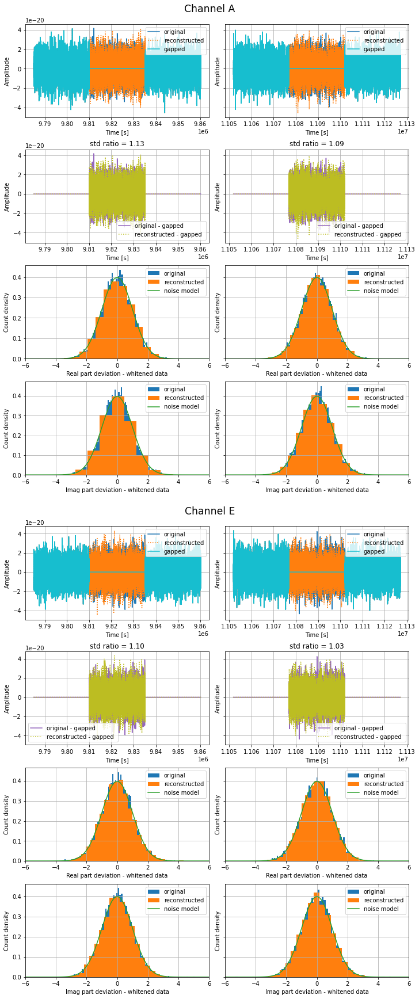

In [30]:
view_gaps(ts = datan['t'],
          ys = [[datan[names] for names in datan.dtype.names[1:]], 
                [datang_rec[names] for names in datan.dtype.names[1:]]],
          yg = [datang[names] for names in datan.dtype.names[1:]],
          maskinfo = spritzmask, channels = ['A', 'E'],
          labels=['original', 'reconstructed', 'gapped'],
          save = False, fname = figname, nwing=5000)

In [31]:
fdatan_rec, psddata_rec, _ = generate_freq_data(datang_rec) 

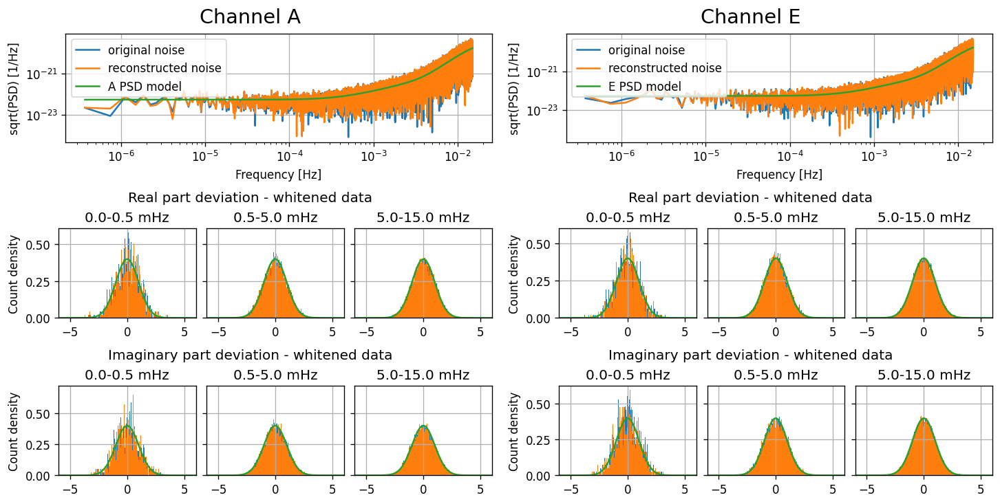

In [32]:
# plot comparison
plot_compare_spectra_timeseries(data = [datan, datang_rec],
                                fmax = 1.5e-2, freq_bands=[5e-4, 5e-3],
                               labels = ['original noise', 'reconstructed noise'], 
                                save = False, fname = figname)

## 5. Perform data imputation with freq-domain PSD estimation

In [33]:
from bayesdawn import datamodel, psdmodel

### 5.1 Import PSD freq domain estimation tool
Import John's frequency domain PSD estimation tool.

In [34]:
import bayesdawn.connect.fillgaps as fillgaps
from bayesdawn.connect.fillgaps import makeFDdata


### 5.2 PSD estimated with `fit_type=None`

 `fmin` value is 3.73e-07
Computation of autocovariance + PSD took 7.688994884490967
Computation of autocovariance + PSD took 0.2113180160522461
Computation of autocovariance + PSD took 0.2055339813232422
Computation of autocovariance + PSD took 0.20458316802978516
Computation of autocovariance + PSD took 0.2383558750152588
Computation of autocovariance + PSD took 0.2099618911743164
Computation of autocovariance + PSD took 0.22089600563049316
Imputation for combination A took 13.847407102584839
Computation of autocovariance + PSD took 6.53833794593811
Computation of autocovariance + PSD took 0.21878671646118164
Computation of autocovariance + PSD took 0.20492005348205566
Computation of autocovariance + PSD took 0.20554804801940918
Computation of autocovariance + PSD took 0.20466017723083496
Computation of autocovariance + PSD took 0.21629810333251953
Computation of autocovariance + PSD took 0.21712279319763184
Imputation for combination E took 12.676644086837769


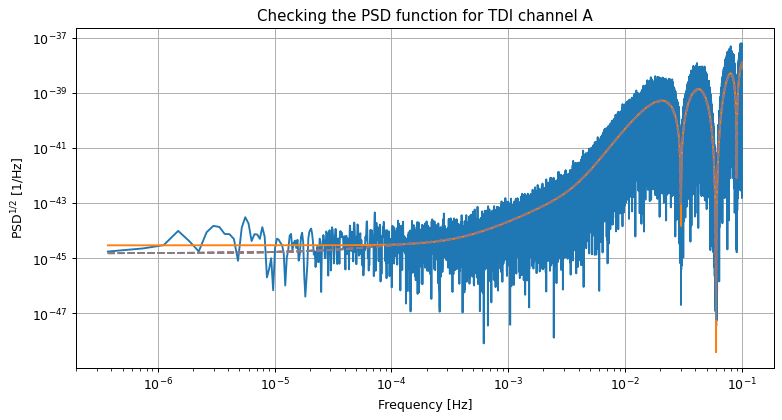

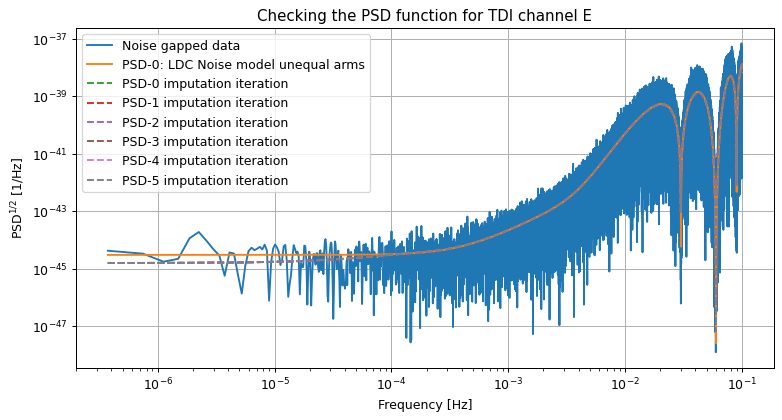

In [35]:
# data imputation with iteration loop
# create empty arrays for the imputation
imp_cls = []
psd_cls = []
y_res = []
# create reconstructed data array with empty A, E, T fields
datang_rec = np.rec.fromarrays([datang['t']]+3*[np.zeros(len(datang['t']))], 
                               names = datang.dtype.names)
# set up flags and variables
names = ['A', 'E']
mask = spritzmask['mask']
# imputation settings
n_iter = 6
fit_type = None
fit_dof = 6
k = 1
fmin = 1 / t_obs * k
print(' `fmin` value is {:.2e}'.format(fmin))


## initialize imputation
for tdi in names:
    t1 = time.time()
    psd_cls, imp_cls, y_res = create_imputation(datang, tdi, mask, noise_model = 'spritz')
    datang_rec[tdi] = y_res
    
    fig, ax = plt.subplots(1, 1, figsize=(10,5),dpi=90)
    ax.set_title(r"Checking the PSD function for TDI channel "+tdi)
    ax.set_xlabel(r"Frequency [Hz]")
    ax.set_ylabel(r"PSD${}^{1/2}$ [1/Hz]") 
    ax.loglog(psddatang['f'], (psddatang[tdi]), label="Noise gapped data")
    ax.loglog(psd_cls.f[psd_cls.f>0], psd_cls.psd_fn(psd_cls.f[psd_cls.f>0]), label="PSD-0: LDC Noise model unequal arms")
    ax.grid()

    for i in range(n_iter):
        psdmod, imp_cls, y_res = update_imputation(data_rec = datang_rec, imp_cls = imp_cls, channel = tdi,
                                                  fit_type = fit_type, fmin=fmin)
        datang_rec[tdi] = y_res
        
        ax.loglog(psdmod.f[psdmod.f>0], (psdmod.psd_fn(psdmod.f[psdmod.f>0])), ls='--', 
                  label='PSD-'+str(i)+' imputation iteration')
        
    t2 = time.time()
    print("Imputation for combination " + tdi + " took " + str(t2-t1))

ax.legend(loc='upper left')
ax.grid()

ax.grid()

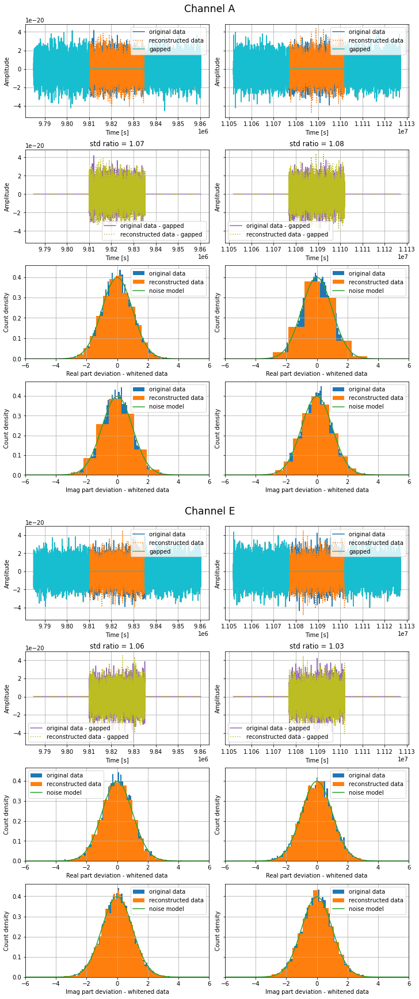

In [36]:
view_gaps(ts = datan['t'],
          ys = [[datan[names] for names in datan.dtype.names[1:]], 
                [datang_rec[names] for names in datan.dtype.names[1:]]],
          yg = [datang[names] for names in datan.dtype.names[1:]],
          maskinfo = spritzmask, channels = ['A', 'E'],
          labels=['original data', 'reconstructed data', 'gapped data'],
          save = False, fname = figname, nwing=5000)

In [37]:
fdatan_rec, psddata_rec, _ = generate_freq_data(datang_rec) 

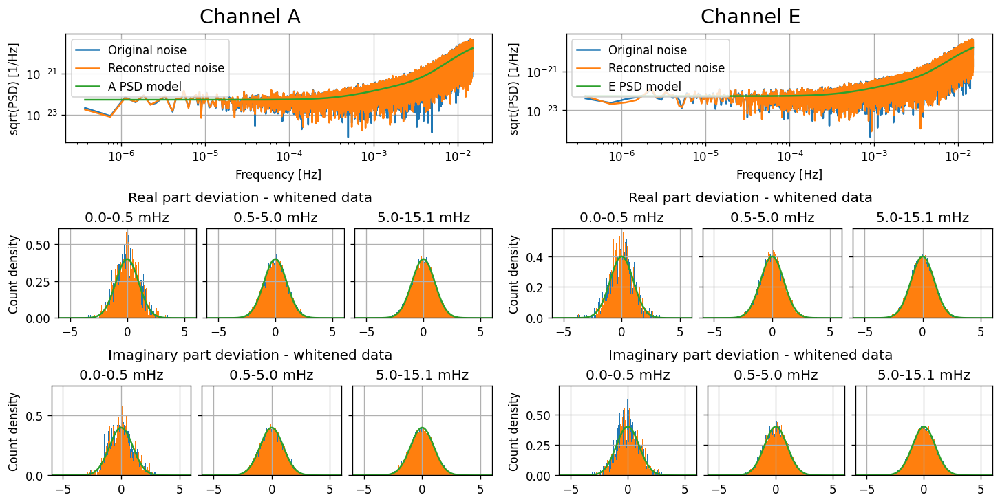

In [38]:
# plot comparison
plot_compare_spectra_timeseries(data = [datan, datang_rec], 
                                freq_bands=[5e-4, 5e-3],
                                fmax = 1.51e-2,
                               labels = ['Original noise', 'Reconstructed noise'], 
                                save = False, fname = figname)

### 5.3 PSD estimated with `fit_type='log_spline`
#### Test 1: `fit_dof=6`, `k_fmin = 1`, `n_iter=10`

 `fmin` value is 3.73e-07
Computation of autocovariance + PSD took 8.382362842559814
Computation of autocovariance + PSD took 0.24029970169067383
Computation of autocovariance + PSD took 0.23454809188842773
Computation of autocovariance + PSD took 0.22456884384155273
Computation of autocovariance + PSD took 0.22545480728149414
Computation of autocovariance + PSD took 0.22556686401367188
Computation of autocovariance + PSD took 0.23582005500793457
Computation of autocovariance + PSD took 0.25652599334716797
Computation of autocovariance + PSD took 0.25231170654296875
Computation of autocovariance + PSD took 0.25942087173461914
Computation of autocovariance + PSD took 0.2316431999206543
Imputation for combination A took 17.49187707901001
Computation of autocovariance + PSD took 6.824627876281738
Computation of autocovariance + PSD took 0.24274110794067383
Computation of autocovariance + PSD took 0.2722020149230957
Computation of autocovariance + PSD took 0.230485200881958
Computation of 

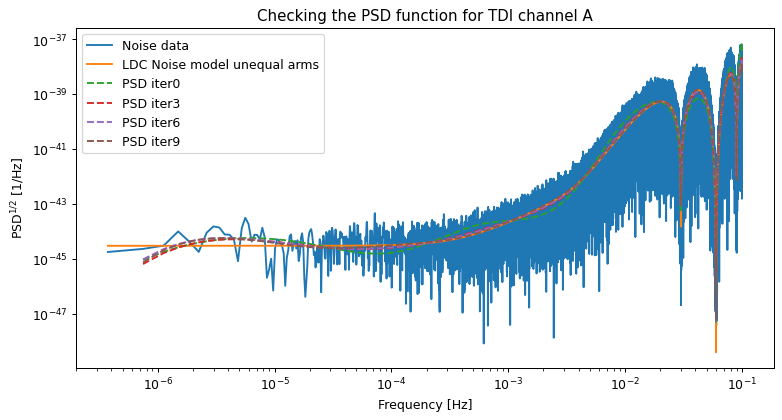

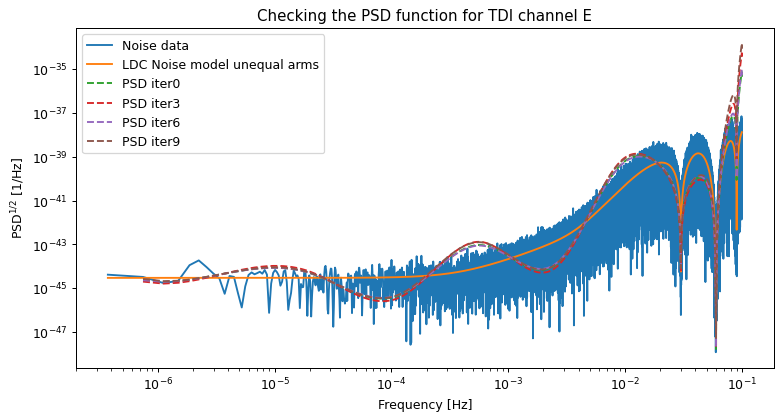

In [39]:
# data imputation with iteration loop
# create empty arrays for the imputation
imp_cls = []
psd_cls = []
y_res = []
# create reconstructed data array with empty A, E, T fields
datang_rec = np.rec.fromarrays([datang['t']]+3*[np.zeros(len(datang['t']))], 
                               names = datang.dtype.names)
# set up flags and variables
names=['A', 'E']
mask = spritzmask['mask']
n_iter = 10
fit_type = 'log_spline'
fit_dof = 6
k = 1
fmin = 1 / t_obs * k
print(' `fmin` value is {:.2e}'.format(fmin))

# perform data imputation

## initialize imputation

for tdi in names:
    t1 = time.time()
    psd_cls, imp_cls, y_res = create_imputation(datang, tdi, mask, noise_model = 'spritz')
    datang_rec[tdi] = y_res
    
    fig, ax = plt.subplots(1, 1, figsize=(10,5),dpi=90)
    ax.set_title(r"Checking the PSD function for TDI channel "+tdi)
    ax.set_xlabel(r"Frequency [Hz]")
    ax.set_ylabel(r"PSD${}^{1/2}$ [1/Hz]") 
    ax.loglog(psddatang['f'], (psddatang[tdi]), label="Noise data")
    ax.loglog(psd_cls.f[psd_cls.f>0], psd_cls.psd_fn(psd_cls.f[psd_cls.f>0]), label="LDC Noise model unequal arms")
    ax.grid()
    
    for i in range(n_iter):
        psdmod, imp_cls, y_res = update_imputation(data_rec = datang_rec, imp_cls = imp_cls, channel = tdi,
                                                  fit_type = fit_type, fit_dof=fit_dof, fmin=fmin)
        datang_rec[tdi] = y_res
        if (i % 3)==0:
            ax.loglog(psdmod.f[psdmod.f>fmin], (psdmod.psd_fn(psdmod.f[psdmod.f>fmin])), ls='--', label="PSD iter"+str(i))
            ax.legend(loc='upper left')
    t2 = time.time()
    print("Imputation for combination " + tdi + " took " + str(t2-t1))
    ax.legend(loc='best')
    ax.grid()

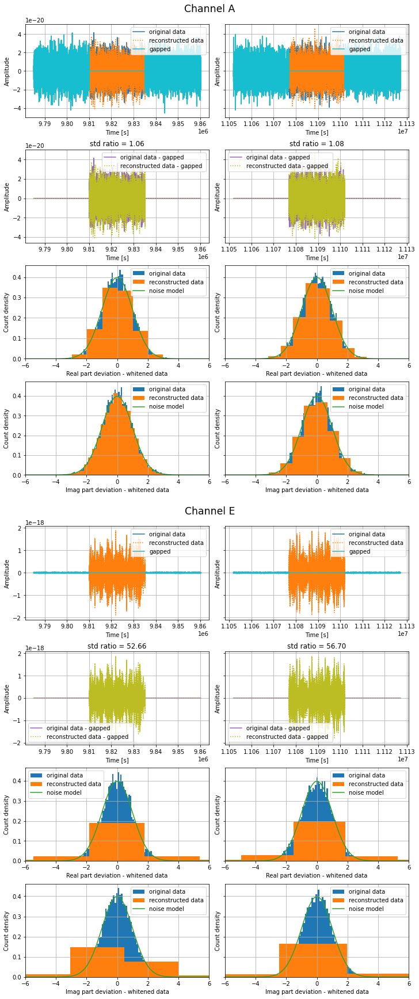

In [40]:
view_gaps(ts = datan['t'],
          ys = [[datan[names] for names in datan.dtype.names[1:]], 
                [datang_rec[names] for names in datan.dtype.names[1:]]],
          yg = [datang[names] for names in datan.dtype.names[1:]],
          maskinfo = spritzmask, channels = ['A', 'E'],
          labels=['original data', 'reconstructed data', 'gapped data'],
          save = False, fname = figname, nwing=5000)

In [41]:
fdatan_rec, psddata_rec, _ = generate_freq_data(datang_rec) 

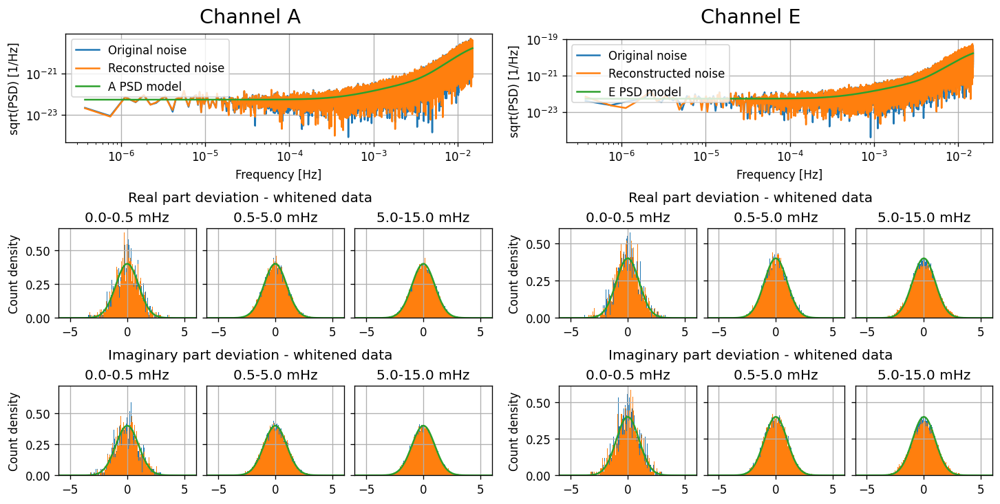

In [42]:
# plot comparison
plot_compare_spectra_timeseries(data = [datan, datang_rec], 
                                freq_bands=[5e-4, 5e-3],
                                fmax = 1.5e-2,
                               labels = ['Original noise', 'Reconstructed noise'], 
                                save = False, fname = figname)

#### Test 2: `fit_dof=15`, `k_fmin = 1`, `n_iter=10`

 `fmin` value is 3.73e-07
Computation of autocovariance + PSD took 8.581345081329346
Computation of autocovariance + PSD took 0.24995779991149902
Computation of autocovariance + PSD took 0.23817205429077148
Computation of autocovariance + PSD took 0.24177265167236328
Computation of autocovariance + PSD took 0.23778510093688965
Computation of autocovariance + PSD took 0.23962616920471191
Computation of autocovariance + PSD took 0.26838111877441406
Computation of autocovariance + PSD took 0.28457021713256836
Computation of autocovariance + PSD took 0.2960488796234131
Computation of autocovariance + PSD took 0.27536630630493164
Computation of autocovariance + PSD took 0.3095259666442871
Imputation for combination A took 18.59952425956726
Computation of autocovariance + PSD took 8.24634575843811
Computation of autocovariance + PSD took 0.3097071647644043
Computation of autocovariance + PSD took 0.29535508155822754
Computation of autocovariance + PSD took 0.335798978805542
Computation of au

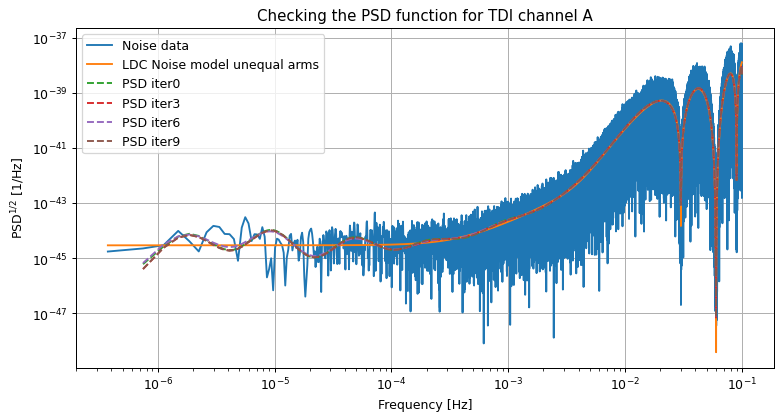

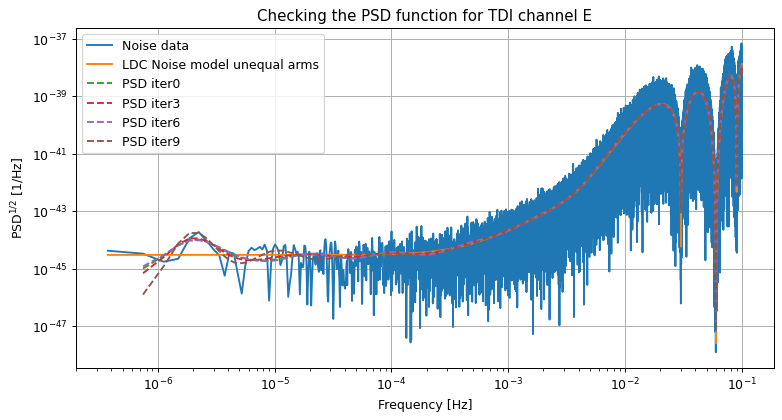

In [43]:
# data imputation with iteration loop
# create empty arrays for the imputation
imp_cls = []
psd_cls = []
y_res = []
# create reconstructed data array with empty A, E, T fields
datang_rec = np.rec.fromarrays([datang['t']]+3*[np.zeros(len(datang['t']))], 
                               names = datang.dtype.names)
# set up flags and variables
names=['A', 'E']
mask = spritzmask['mask']
n_iter = 10
fit_type = 'log_spline'
fit_dof = 15
k = 1
fmin = 1 / t_obs * k
print(' `fmin` value is {:.2e}'.format(fmin))

## initialize imputation

for tdi in names:
    t1 = time.time()
    psd_cls, imp_cls, y_res = create_imputation(datang, tdi, mask, noise_model = 'spritz')
    datang_rec[tdi] = y_res
    
    fig, ax = plt.subplots(1, 1, figsize=(10,5),dpi=90)
    ax.set_title(r"Checking the PSD function for TDI channel "+tdi)
    ax.set_xlabel(r"Frequency [Hz]")
    ax.set_ylabel(r"PSD${}^{1/2}$ [1/Hz]") 
    ax.loglog(psddatang['f'], (psddatang[tdi]), label="Noise data")
    ax.loglog(psd_cls.f[psd_cls.f>0], psd_cls.psd_fn(psd_cls.f[psd_cls.f>0]), label="LDC Noise model unequal arms")
    ax.grid()
    
    for i in range(n_iter):
        psdmod, imp_cls, y_res = update_imputation(data_rec = datang_rec, imp_cls = imp_cls, channel = tdi,
                                                  fit_type = fit_type, fit_dof=fit_dof, fmin=fmin)
        datang_rec[tdi] = y_res
        if (i % 3)==0:
            ax.loglog(psdmod.f[psdmod.f>fmin], (psdmod.psd_fn(psdmod.f[psdmod.f>fmin])), ls='--', label="PSD iter"+str(i))
            ax.legend(loc='upper left')
    t2 = time.time()
    print("Imputation for combination " + tdi + " took " + str(t2-t1))

ax.legend(loc='best')
ax.grid()

ax.grid()

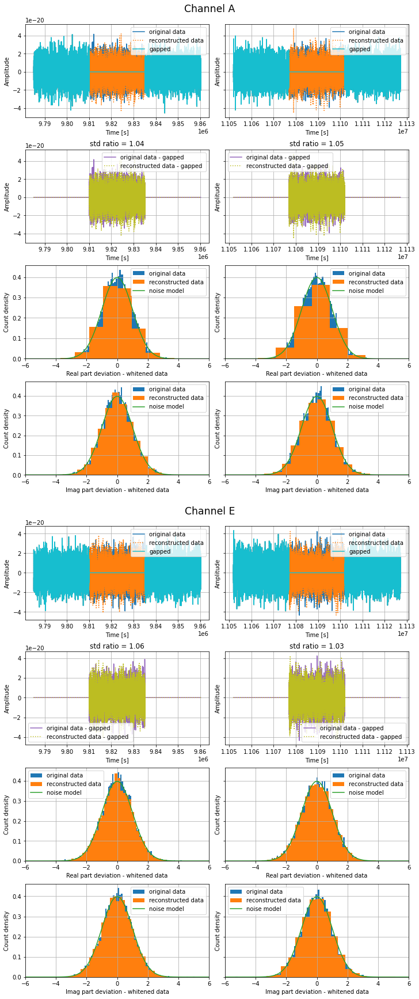

In [44]:
view_gaps(ts = datan['t'],
          ys = [[datan[names] for names in datan.dtype.names[1:]], 
                [datang_rec[names] for names in datan.dtype.names[1:]]],
          yg = [datang[names] for names in datan.dtype.names[1:]],
          maskinfo = spritzmask, channels = ['A', 'E'],
          labels=['original data', 'reconstructed data', 'gapped data'],
          save = False, fname = figname, nwing=5000)

In [45]:
fdatan_rec, psddata_rec, _ = generate_freq_data(datang_rec) 

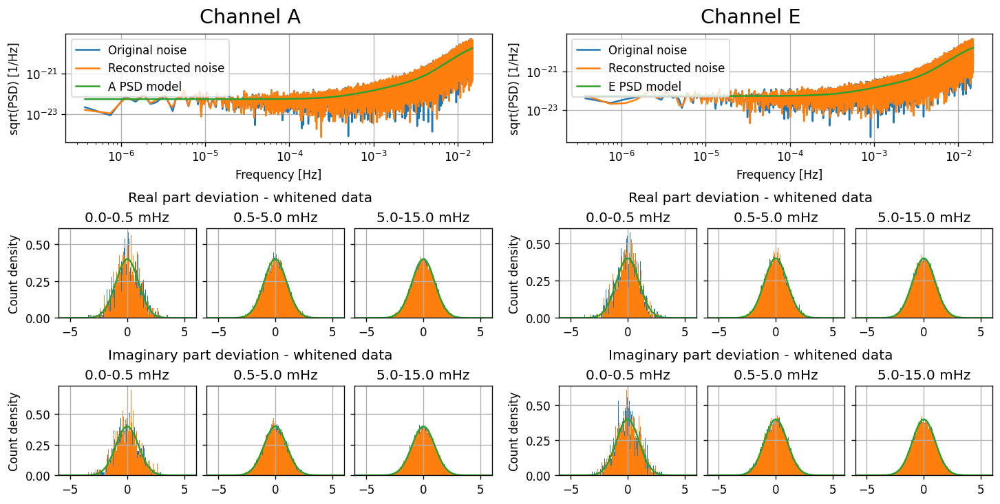

In [46]:
# plot comparison
plot_compare_spectra_timeseries(data = [datan, datang_rec], 
                                freq_bands=[5e-4, 5e-3],
                                fmax = 1.5e-2,
                               labels = ['Original noise', 'Reconstructed noise'], 
                                save = False, fname = figname)

#### Test 3: `fit_dof=30`, `k_fmin = 1`, `n_iter=10`

 `fmin` value is 3.73e-07
Computation of autocovariance + PSD took 7.21183180809021
Computation of autocovariance + PSD took 0.2497539520263672
Computation of autocovariance + PSD took 0.23936176300048828
Computation of autocovariance + PSD took 0.22834014892578125
Computation of autocovariance + PSD took 0.2238931655883789
Computation of autocovariance + PSD took 0.23960399627685547
Computation of autocovariance + PSD took 0.22998404502868652
Computation of autocovariance + PSD took 0.2382493019104004
Computation of autocovariance + PSD took 0.2418379783630371
Computation of autocovariance + PSD took 0.24442410469055176
Computation of autocovariance + PSD took 0.23348093032836914
Computation of autocovariance + PSD took 6.470733880996704
Computation of autocovariance + PSD took 0.2419600486755371
Computation of autocovariance + PSD took 0.2476041316986084
Computation of autocovariance + PSD took 0.29824209213256836
Computation of autocovariance + PSD took 0.2785310745239258
Computatio

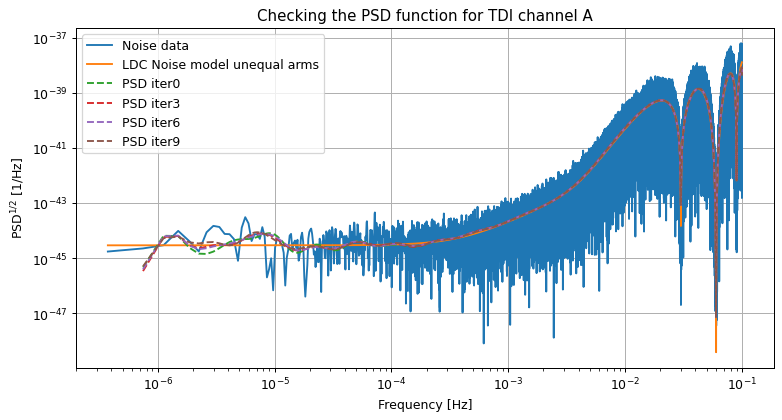

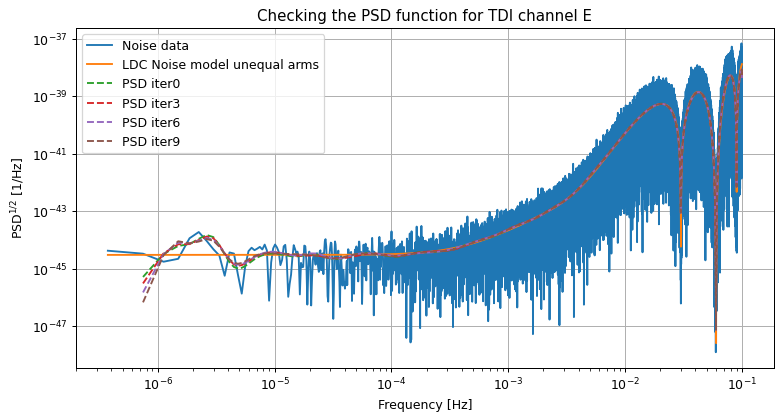

In [47]:
# data imputation with iteration loop
# create empty arrays for the imputation
imp_cls = []
psd_cls = []
y_res = []
# create reconstructed data array with empty A, E, T fields
datang_rec = np.rec.fromarrays([datang['t']]+3*[np.zeros(len(datang['t']))], 
                               names = datang.dtype.names)
# set up flags and variables
names=['A', 'E']
mask = spritzmask['mask']
n_iter = 10
fit_type = 'log_spline'
fit_dof = 30
k = 1
fmin = 1 / t_obs * k
print(' `fmin` value is {:.2e}'.format(fmin))
# perform data imputation

## initialize imputation

for tdi in names:
    t1 = time.time()
    psd_cls, imp_cls, y_res = create_imputation(datang, tdi, mask, noise_model = 'spritz')
    datang_rec[tdi] = y_res
    
    fig, ax = plt.subplots(1, 1, figsize=(10,5),dpi=90)
    ax.set_title(r"Checking the PSD function for TDI channel "+tdi)
    ax.set_xlabel(r"Frequency [Hz]")
    ax.set_ylabel(r"PSD${}^{1/2}$ [1/Hz]") 
    ax.loglog(psddatang['f'], (psddatang[tdi]), label="Noise data")
    ax.loglog(psd_cls.f[psd_cls.f>0], psd_cls.psd_fn(psd_cls.f[psd_cls.f>0]), label="LDC Noise model unequal arms")
    ax.grid()
    
    for i in range(n_iter):
        psdmod, imp_cls, y_res = update_imputation(data_rec = datang_rec, imp_cls = imp_cls, channel = tdi,
                                                  fit_type = fit_type, fit_dof=fit_dof, fmin=fmin)
        datang_rec[tdi] = y_res
        if (i % 3)==0:
            ax.loglog(psdmod.f[psdmod.f>fmin], (psdmod.psd_fn(psdmod.f[psdmod.f>fmin])), ls='--', label="PSD iter"+str(i))
            ax.legend(loc='upper left')
    t2 = time.time()

ax.legend(loc='best')
ax.grid()

ax.grid()

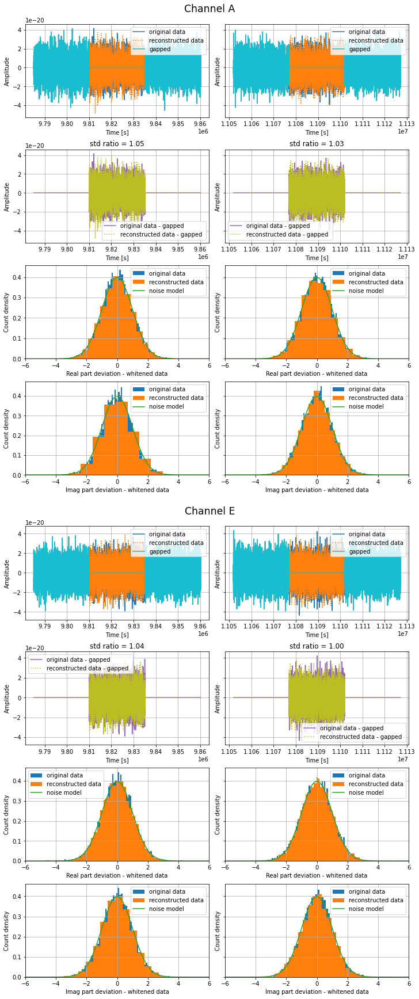

In [48]:
view_gaps(ts = datan['t'],
          ys = [[datan[names] for names in datan.dtype.names[1:]], 
                [datang_rec[names] for names in datan.dtype.names[1:]]],
          yg = [datang[names] for names in datan.dtype.names[1:]],
          maskinfo = spritzmask, channels = ['A', 'E'],
          labels=['original data', 'reconstructed data', 'gapped data'],
          save = False, fname = figname, nwing=5000)

In [49]:
fdatan_rec, psddata_rec, _ = generate_freq_data(datang_rec) 

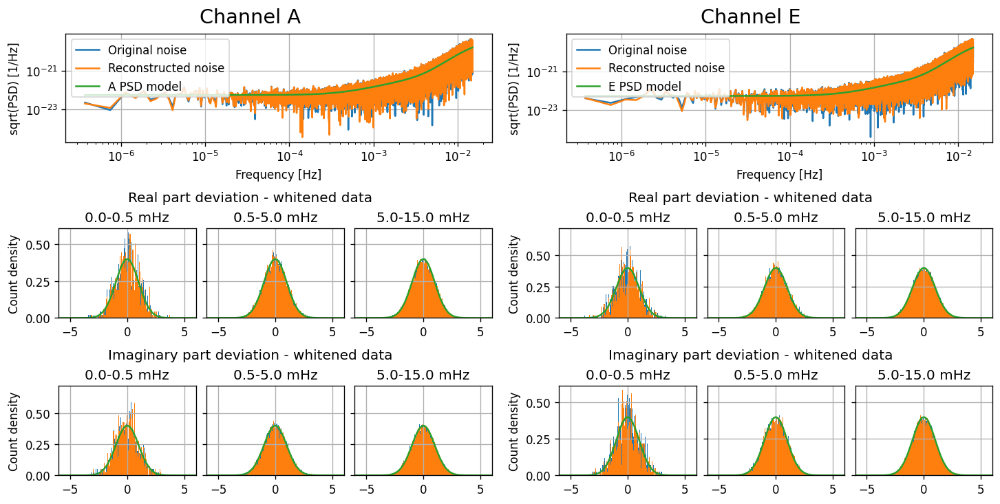

In [50]:
# plot comparison
plot_compare_spectra_timeseries(data = [datan, datang_rec], 
                                freq_bands=[5e-4, 5e-3],
                                fmax = 1.5e-2,
                               labels = ['Original noise', 'Reconstructed noise'], 
                                save = False, fname = figname)

#### Test 4: `fit_dof=6`, `k_fmin = 5`, `n_iter=10`

 `fmin` value is 1.87e-06
Computation of autocovariance + PSD took 7.577849864959717
Computation of autocovariance + PSD took 0.2485959529876709
Computation of autocovariance + PSD took 0.22950506210327148
Computation of autocovariance + PSD took 0.22424912452697754
Computation of autocovariance + PSD took 0.22739791870117188
Computation of autocovariance + PSD took 0.22475123405456543
Computation of autocovariance + PSD took 0.2352750301361084
Computation of autocovariance + PSD took 0.23394298553466797
Computation of autocovariance + PSD took 0.2294008731842041
Computation of autocovariance + PSD took 0.23584818840026855
Computation of autocovariance + PSD took 0.24372196197509766
Imputation for combination A took 17.069579124450684
Computation of autocovariance + PSD took 8.362092971801758
Computation of autocovariance + PSD took 0.24524617195129395
Computation of autocovariance + PSD took 0.24882197380065918
Computation of autocovariance + PSD took 0.247056245803833
Computation of 

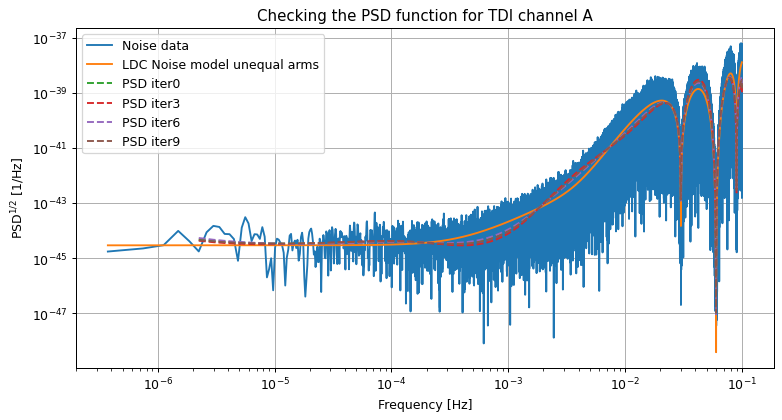

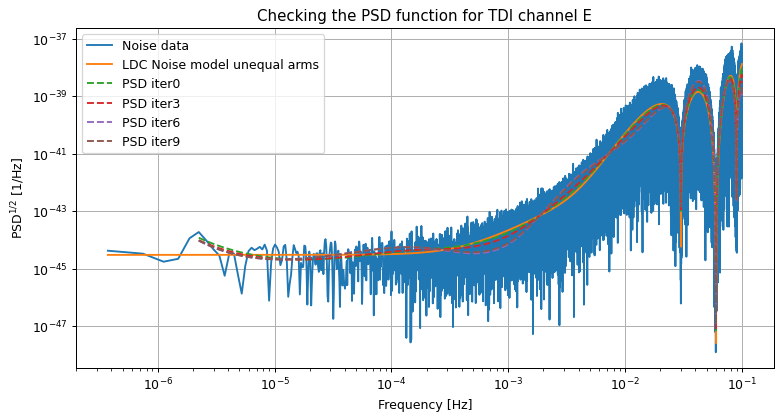

In [51]:
# data imputation with iteration loop
# create empty arrays for the imputation
imp_cls = []
psd_cls = []
y_res = []
# create reconstructed data array with empty A, E, T fields
datang_rec = np.rec.fromarrays([datang['t']]+3*[np.zeros(len(datang['t']))], 
                               names = datang.dtype.names)
# set up flags and variables
names=['A', 'E']
mask = spritzmask['mask']
n_iter = 10
fit_type = 'log_spline'
fit_dof = 6
k = 5
fmin = 1 / t_obs * k
print(' `fmin` value is {:.2e}'.format(fmin))
# perform data imputation

## initialize imputation

for tdi in names:
    t1 = time.time()
    psd_cls, imp_cls, y_res = create_imputation(datang, tdi, mask, noise_model = 'spritz')
    datang_rec[tdi] = y_res
    
    fig, ax = plt.subplots(1, 1, figsize=(10,5),dpi=90)
    ax.set_title(r"Checking the PSD function for TDI channel "+tdi)
    ax.set_xlabel(r"Frequency [Hz]")
    ax.set_ylabel(r"PSD${}^{1/2}$ [1/Hz]") 
    ax.loglog(psddatang['f'], (psddatang[tdi]), label="Noise data")
    ax.loglog(psd_cls.f[psd_cls.f>0], psd_cls.psd_fn(psd_cls.f[psd_cls.f>0]), label="LDC Noise model unequal arms")
    ax.grid()
    
    for i in range(n_iter):
        psdmod, imp_cls, y_res = update_imputation(data_rec = datang_rec, imp_cls = imp_cls, channel = tdi,
                                                  fit_type = fit_type, fit_dof=fit_dof, fmin=fmin)
        datang_rec[tdi] = y_res

        if (i % 3)==0:
            ax.loglog(psdmod.f[psdmod.f>fmin], (psdmod.psd_fn(psdmod.f[psdmod.f>fmin])), ls='--', label="PSD iter"+str(i))
            ax.legend(loc='upper left')
    t2 = time.time()
    print("Imputation for combination " + tdi + " took " + str(t2-t1))

ax.legend(loc='best')
ax.grid()

ax.grid()

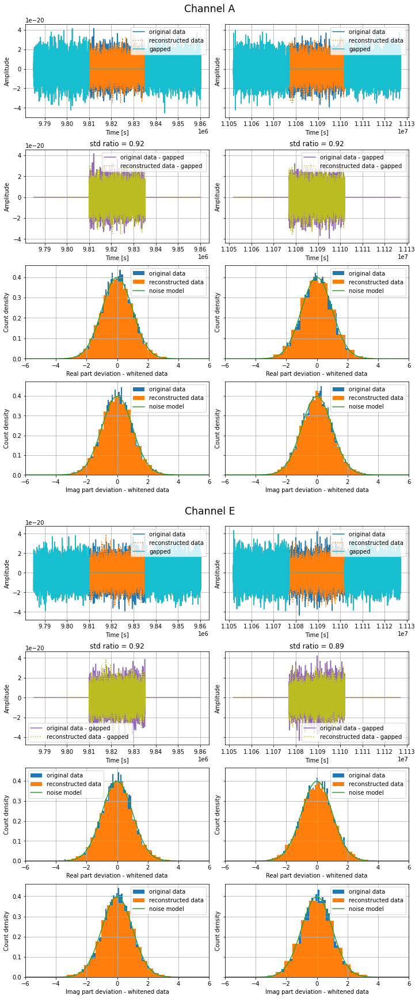

In [52]:
view_gaps(ts = datan['t'],
          ys = [[datan[names] for names in datan.dtype.names[1:]], 
                [datang_rec[names] for names in datan.dtype.names[1:]]],
          yg = [datang[names] for names in datan.dtype.names[1:]],
          maskinfo = spritzmask, channels = ['A', 'E'],
          labels=['original data', 'reconstructed data', 'gapped data'],
          save = False, fname = figname, nwing=5000)

In [53]:
fdatan_rec, psddata_rec, _ = generate_freq_data(datang_rec) 

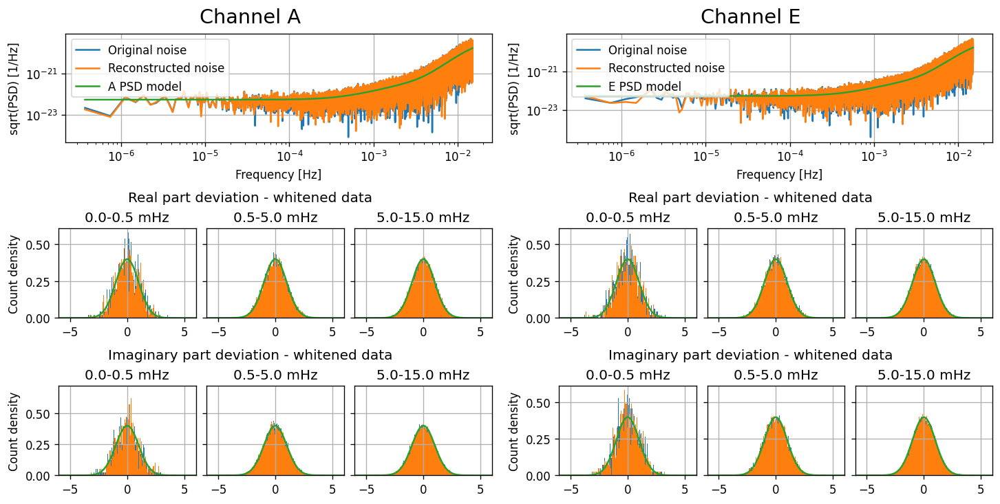

In [54]:
# plot comparison
plot_compare_spectra_timeseries(data = [datan, datang_rec], 
                                freq_bands=[5e-4, 5e-3],
                                fmax = 1.5e-2,
                               labels = ['Original noise', 'Reconstructed noise'], 
                                save = False, fname = figname)

#### Test 5: `fit_dof=6`, `k_fmin = 10`, `n_iter=10`

 `fmin` value is 3.73e-06
Computation of autocovariance + PSD took 7.602632999420166
Computation of autocovariance + PSD took 0.23319196701049805
Computation of autocovariance + PSD took 0.26766204833984375
Computation of autocovariance + PSD took 0.2801399230957031
Computation of autocovariance + PSD took 0.24205303192138672
Computation of autocovariance + PSD took 0.24237298965454102
Computation of autocovariance + PSD took 0.22697114944458008
Computation of autocovariance + PSD took 0.23538804054260254
Computation of autocovariance + PSD took 0.2576439380645752
Computation of autocovariance + PSD took 0.22422575950622559
Computation of autocovariance + PSD took 0.2594718933105469
Imputation for combination A took 17.145857095718384
Computation of autocovariance + PSD took 6.70570182800293
Computation of autocovariance + PSD took 0.24329090118408203
Computation of autocovariance + PSD took 0.24747109413146973
Computation of autocovariance + PSD took 0.2671802043914795
Computation of 

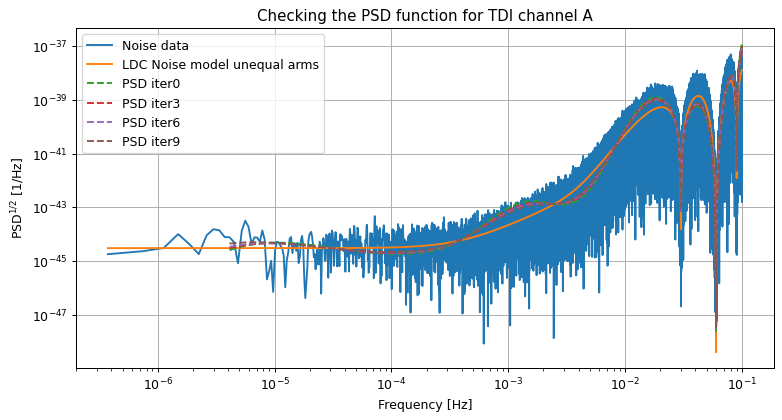

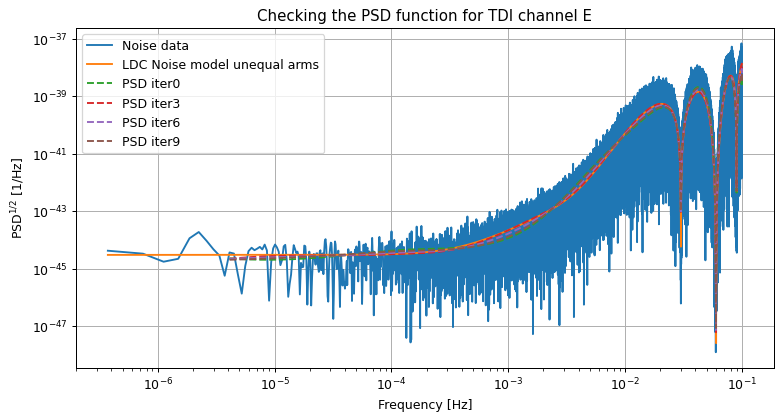

In [55]:
# data imputation with iteration loop
# create empty arrays for the imputation
imp_cls = []
psd_cls = []
y_res = []
# create reconstructed data array with empty A, E, T fields
datang_rec = np.rec.fromarrays([datang['t']]+3*[np.zeros(len(datang['t']))], 
                               names = datang.dtype.names)
# set up flags and variables
names=['A', 'E']
mask = spritzmask['mask']
n_iter = 10
fit_type = 'log_spline'
fit_dof = 6
k = 10
fmin = 1 / t_obs * k
print(' `fmin` value is {:.2e}'.format(fmin))
# perform data imputation

## initialize imputation

for tdi in names:    
    t1 = time.time()
    psd_cls, imp_cls, y_res = create_imputation(datang, tdi, mask, noise_model = 'spritz')
    datang_rec[tdi] = y_res
    
    fig, ax = plt.subplots(1, 1, figsize=(10,5),dpi=90)
    ax.set_title(r"Checking the PSD function for TDI channel "+tdi)
    ax.set_xlabel(r"Frequency [Hz]")
    ax.set_ylabel(r"PSD${}^{1/2}$ [1/Hz]") 
    ax.loglog(psddatang['f'], (psddatang[tdi]), label="Noise data")
    ax.loglog(psd_cls.f[psd_cls.f>0], psd_cls.psd_fn(psd_cls.f[psd_cls.f>0]), label="LDC Noise model unequal arms")
    ax.grid()
    for i in range(n_iter):
        psdmod, imp_cls, y_res = update_imputation(data_rec = datang_rec, imp_cls = imp_cls, channel = tdi,
                                                  fit_type = fit_type, fit_dof=fit_dof, fmin=fmin)
        datang_rec[tdi] = y_res
        if (i % 3)==0:
            ax.loglog(psdmod.f[psdmod.f>fmin], (psdmod.psd_fn(psdmod.f[psdmod.f>fmin])), ls='--', label="PSD iter"+str(i))
            ax.legend(loc='upper left')
    t2 = time.time()
    print("Imputation for combination " + tdi + " took " + str(t2-t1))

ax.legend(loc='best')
ax.grid()

ax.grid()

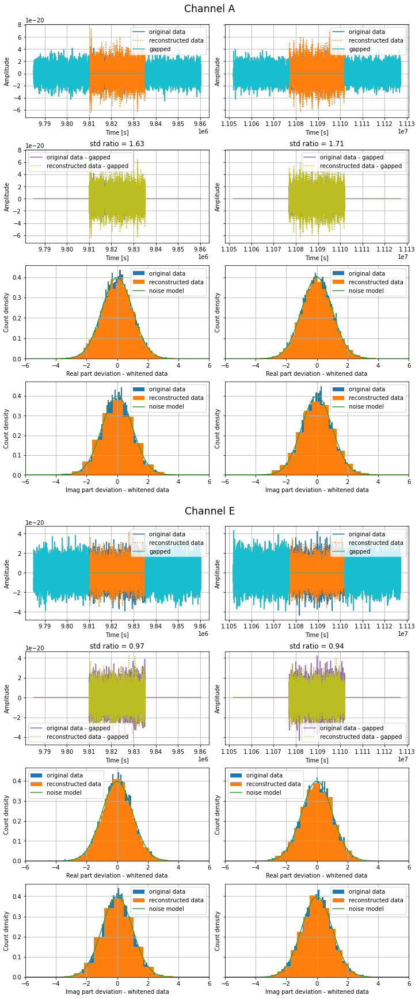

In [56]:
view_gaps(ts = datan['t'],
          ys = [[datan[names] for names in datan.dtype.names[1:]], 
                [datang_rec[names] for names in datan.dtype.names[1:]]],
          yg = [datang[names] for names in datan.dtype.names[1:]],
          maskinfo = spritzmask, channels = ['A', 'E'],
          labels=['original data', 'reconstructed data', 'gapped data'],
          save = False, fname = figname, nwing=5000)

In [57]:
fdatan_rec, psddata_rec, _ = generate_freq_data(datang_rec) 

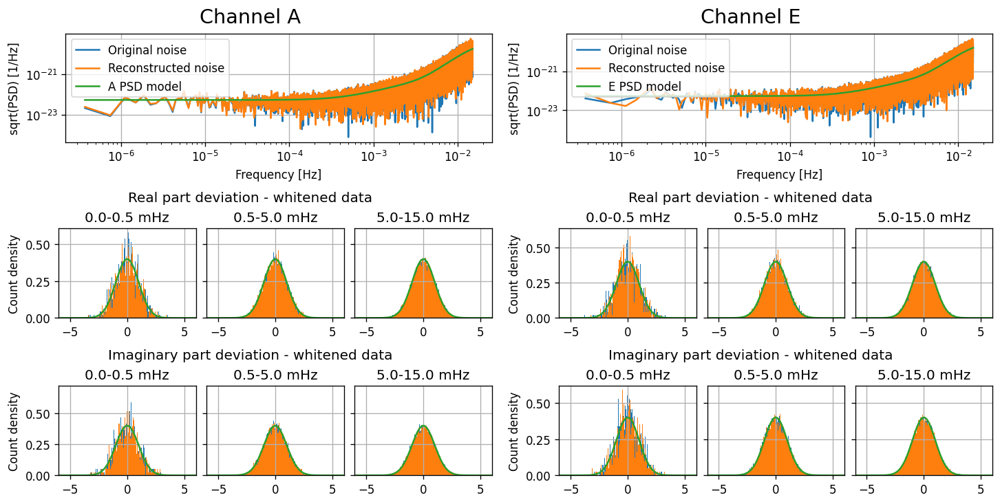

In [58]:
# plot comparison
plot_compare_spectra_timeseries(data = [datan, datang_rec], 
                                freq_bands=[5e-4, 5e-3],
                                fmax = 1.5e-2,
                               labels = ['Original noise', 'Reconstructed noise'], 
                                save = False, fname = figname)

#### Test 6: `fit_dof=6`, `k_fmin = 20`, `n_iter=10`

 `fmin` value is 7.47e-06
Computation of autocovariance + PSD took 9.821151971817017
Computation of autocovariance + PSD took 0.23893308639526367
Computation of autocovariance + PSD took 0.2564830780029297
Computation of autocovariance + PSD took 0.2401752471923828
Computation of autocovariance + PSD took 0.24087119102478027
Computation of autocovariance + PSD took 0.23745989799499512
Computation of autocovariance + PSD took 0.2513439655303955
Computation of autocovariance + PSD took 0.254406213760376
Computation of autocovariance + PSD took 0.24486303329467773
Computation of autocovariance + PSD took 0.25086021423339844
Computation of autocovariance + PSD took 0.2509779930114746
Imputation for combination A took 19.337707042694092
Computation of autocovariance + PSD took 6.9828691482543945
Computation of autocovariance + PSD took 0.25275707244873047
Computation of autocovariance + PSD took 0.2513153553009033
Computation of autocovariance + PSD took 0.23931097984313965
Computation of a

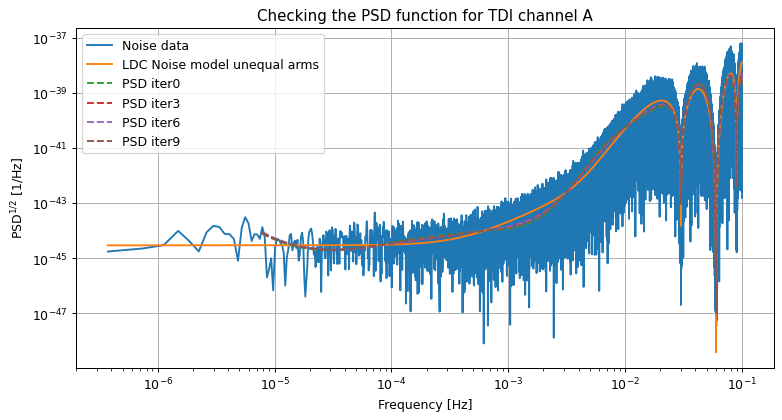

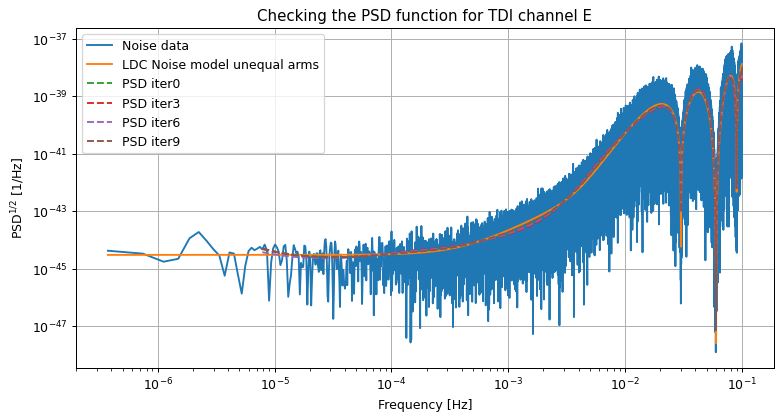

In [59]:
# data imputation with iteration loop
# create empty arrays for the imputation
imp_cls = []
psd_cls = []
y_res = []
# create reconstructed data array with empty A, E, T fields
datang_rec = np.rec.fromarrays([datang['t']]+3*[np.zeros(len(datang['t']))], 
                               names = datang.dtype.names)
# set up flags and variables
names=['A', 'E']
mask = spritzmask['mask']
n_iter = 10
fit_type = 'log_spline'
fit_dof = 6
k = 20
fmin = 1 / t_obs * k
print(' `fmin` value is {:.2e}'.format(fmin))

## initialize imputation

for tdi in names:
    t1 = time.time()
    psd_cls, imp_cls, y_res = create_imputation(datang, tdi, mask, noise_model = 'spritz')
    datang_rec[tdi] = y_res
    
    fig, ax = plt.subplots(1, 1, figsize=(10,5),dpi=90)
    ax.set_title(r"Checking the PSD function for TDI channel "+tdi)
    ax.set_xlabel(r"Frequency [Hz]")
    ax.set_ylabel(r"PSD${}^{1/2}$ [1/Hz]") 
    ax.loglog(psddatang['f'], (psddatang[tdi]), label="Noise data")
    ax.loglog(psd_cls.f[psd_cls.f>0], psd_cls.psd_fn(psd_cls.f[psd_cls.f>0]), label="LDC Noise model unequal arms")
    ax.grid()

    for i in range(n_iter):
        psdmod, imp_cls, y_res = update_imputation(data_rec = datang_rec, imp_cls = imp_cls, channel = tdi,
                                                  fit_type = fit_type, fit_dof=fit_dof, fmin=fmin)
        datang_rec[tdi] = y_res
        if (i % 3)==0:
            ax.loglog(psdmod.f[psdmod.f>fmin], (psdmod.psd_fn(psdmod.f[psdmod.f>fmin])), ls='--', label="PSD iter"+str(i))
            ax.legend(loc='upper left')
    t2 = time.time()
    print("Imputation for combination " + tdi + " took " + str(t2-t1))

ax.legend(loc='best')
ax.grid()

ax.grid()

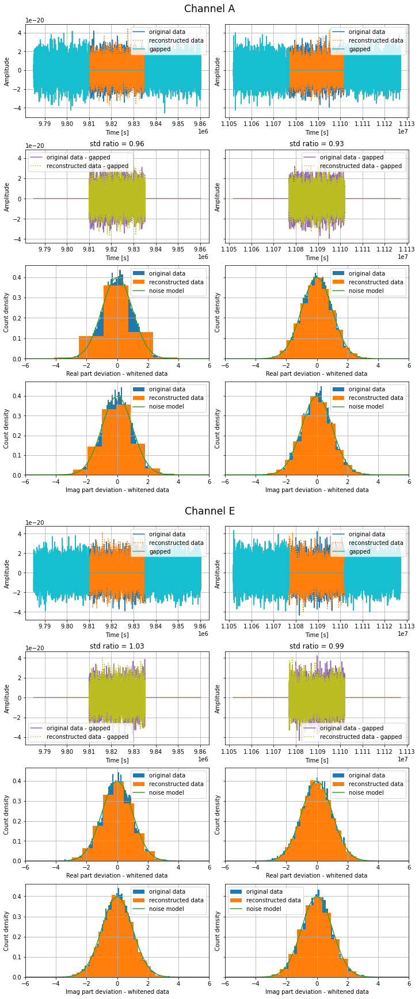

In [60]:
view_gaps(ts = datan['t'],
          ys = [[datan[names] for names in datan.dtype.names[1:]], 
                [datang_rec[names] for names in datan.dtype.names[1:]]],
          yg = [datang[names] for names in datan.dtype.names[1:]],
          maskinfo = spritzmask, channels = ['A', 'E'],
          labels=['original data', 'reconstructed data', 'gapped data'],
          save = False, fname = figname, nwing=5000)

In [61]:
fdatan_rec, psddata_rec, _ = generate_freq_data(datang_rec) 

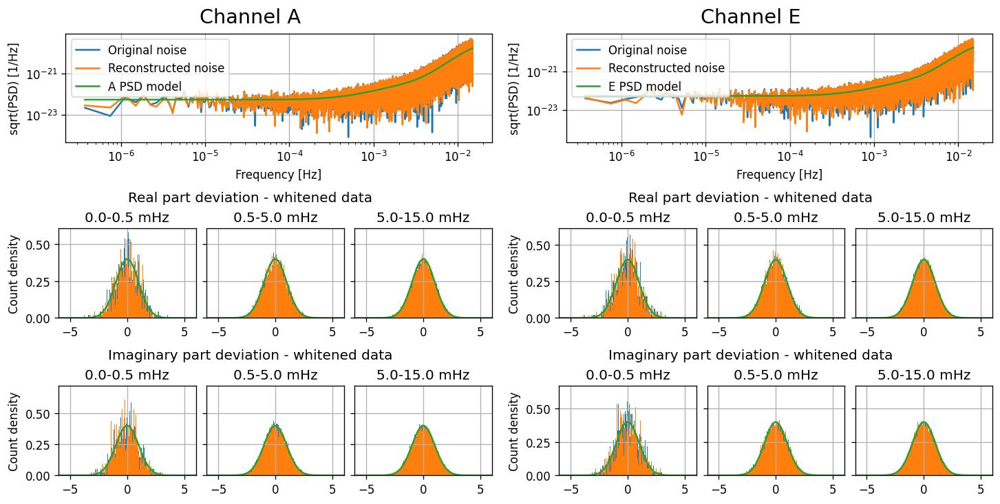

In [62]:
# plot comparison
plot_compare_spectra_timeseries(data = [datan, datang_rec], 
                                freq_bands=[5e-4, 5e-3],
                                fmax = 1.5e-2,
                               labels = ['Original noise', 'Reconstructed noise'], 
                                save = False, fname = figname)

#### Test 7: `fit_dof=15`, `k_fmin = 5`, `n_iter=10`

 `fmin` value is 1.87e-06
Computation of autocovariance + PSD took 7.101992845535278
Computation of autocovariance + PSD took 0.24921393394470215
Computation of autocovariance + PSD took 0.2301938533782959
Computation of autocovariance + PSD took 0.23898911476135254
Computation of autocovariance + PSD took 0.23122406005859375
Computation of autocovariance + PSD took 0.23649215698242188
Computation of autocovariance + PSD took 0.2301790714263916
Computation of autocovariance + PSD took 0.22985315322875977
Computation of autocovariance + PSD took 0.23274898529052734
Computation of autocovariance + PSD took 0.2279200553894043
Computation of autocovariance + PSD took 0.2317488193511963
Imputation for combination A took 16.50783395767212
Computation of autocovariance + PSD took 7.021937847137451
Computation of autocovariance + PSD took 0.24990010261535645
Computation of autocovariance + PSD took 0.2321300506591797
Computation of autocovariance + PSD took 0.2325150966644287
Computation of au

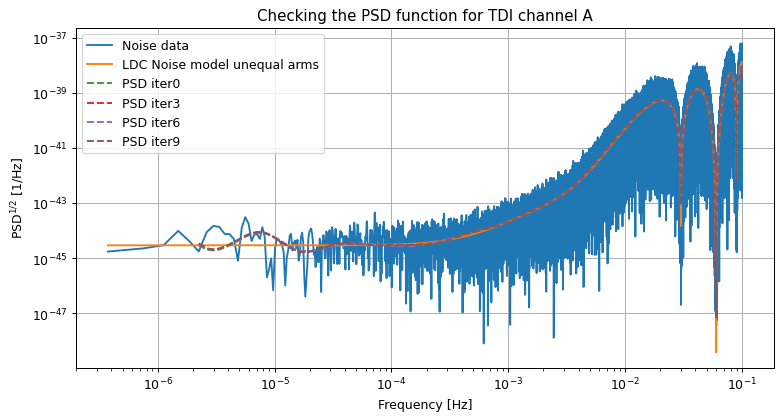

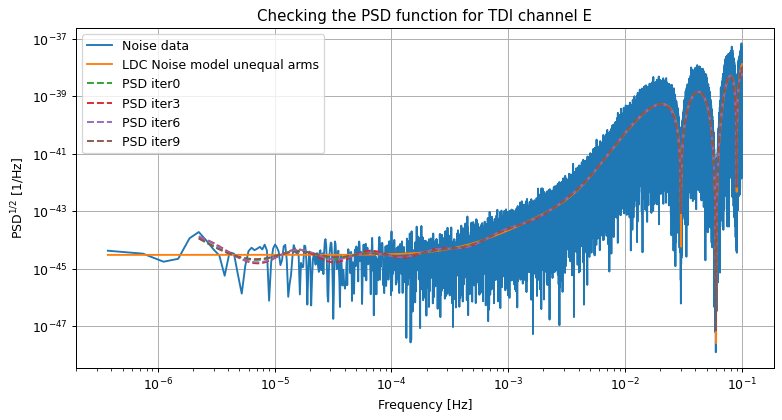

In [63]:
# data imputation with iteration loop
# create empty arrays for the imputation
imp_cls = []
psd_cls = []
y_res = []
# create reconstructed data array with empty A, E, T fields
datang_rec = np.rec.fromarrays([datang['t']]+3*[np.zeros(len(datang['t']))], 
                               names = datang.dtype.names)
# set up flags and variables
names=['A', 'E']
mask = spritzmask['mask']
n_iter = 10
fit_type = 'log_spline'
fit_dof = 15
k = 5
fmin = 1 / t_obs * k
print(' `fmin` value is {:.2e}'.format(fmin))

## initialize imputation

for tdi in names:
    t1 = time.time()
    psd_cls, imp_cls, y_res = create_imputation(datang, tdi, mask, noise_model = 'spritz')
    datang_rec[tdi] = y_res
    
    fig, ax = plt.subplots(1, 1, figsize=(10,5),dpi=90)
    ax.set_title(r"Checking the PSD function for TDI channel "+tdi)
    ax.set_xlabel(r"Frequency [Hz]")
    ax.set_ylabel(r"PSD${}^{1/2}$ [1/Hz]") 
    ax.loglog(psddatang['f'], (psddatang[tdi]), label="Noise data")
    ax.loglog(psd_cls.f[psd_cls.f>0], psd_cls.psd_fn(psd_cls.f[psd_cls.f>0]), label="LDC Noise model unequal arms")
    ax.grid()
   
    for i in range(n_iter):
        psdmod, imp_cls, y_res = update_imputation(data_rec = datang_rec, imp_cls = imp_cls, channel = tdi,
                                                  fit_type = fit_type, fit_dof=fit_dof, fmin=fmin)
        datang_rec[tdi] = y_res
        if (i % 3)==0:
            ax.loglog(psdmod.f[psdmod.f>fmin], (psdmod.psd_fn(psdmod.f[psdmod.f>fmin])), ls='--', label="PSD iter"+str(i))
            ax.legend(loc='upper left')
    t2 = time.time()
    print("Imputation for combination " + tdi + " took " + str(t2-t1))

ax.legend(loc='best')
ax.grid()

ax.grid()

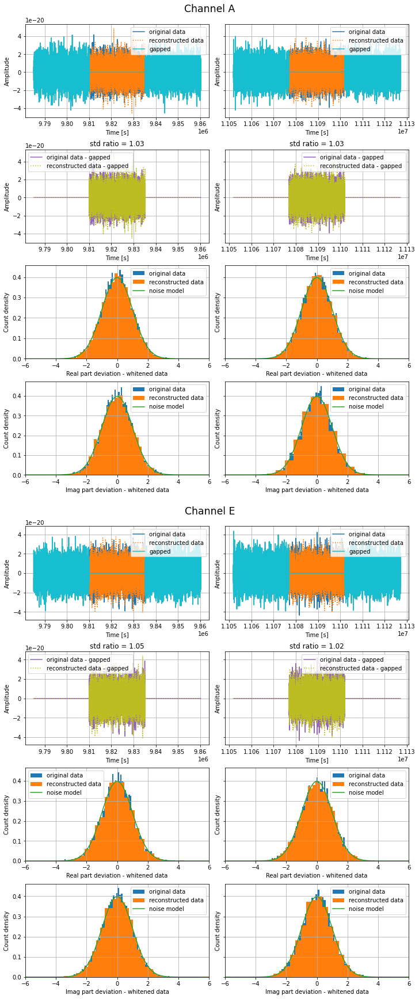

In [64]:
view_gaps(ts = datan['t'],
          ys = [[datan[names] for names in datan.dtype.names[1:]], 
                [datang_rec[names] for names in datan.dtype.names[1:]]],
          yg = [datang[names] for names in datan.dtype.names[1:]],
          maskinfo = spritzmask, channels = ['A', 'E'],
          labels=['original data', 'reconstructed data', 'gapped data'],
          save = False, fname = figname, nwing=5000)

In [65]:
fdatan_rec, psddata_rec, _ = generate_freq_data(datang_rec) 

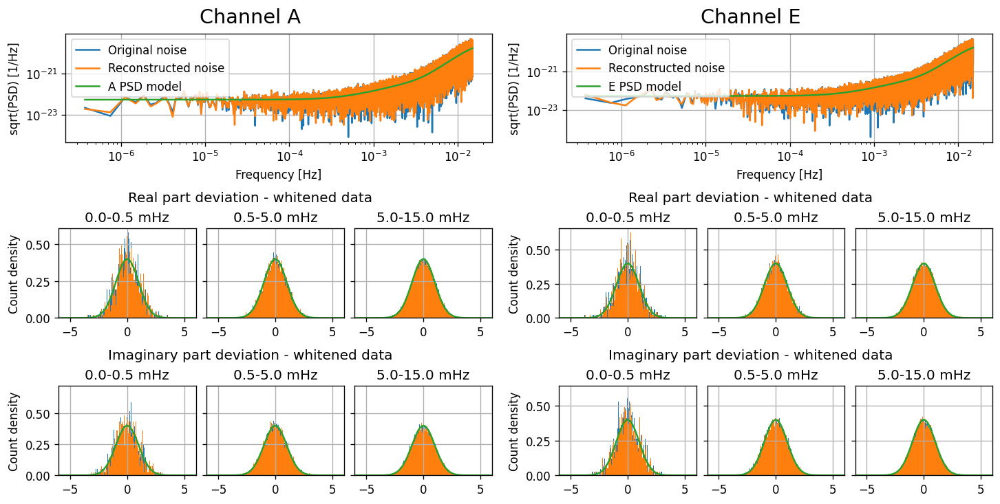

In [66]:
# plot comparison
plot_compare_spectra_timeseries(data = [datan, datang_rec], 
                                freq_bands=[5e-4, 5e-3],
                                fmax = 1.5e-2,
                               labels = ['Original noise', 'Reconstructed noise'], 
                                save = False, fname = figname)

#### Test 8: `fit_dof=15`, `k_fmin = 10`, `n_iter=10`

 `fmin` value is 3.73e-06
Computation of autocovariance + PSD took 7.585799932479858
Computation of autocovariance + PSD took 0.2600369453430176
Computation of autocovariance + PSD took 0.2691190242767334
Computation of autocovariance + PSD took 0.26090288162231445
Computation of autocovariance + PSD took 0.24884796142578125
Computation of autocovariance + PSD took 0.24538493156433105
Computation of autocovariance + PSD took 0.24977803230285645
Computation of autocovariance + PSD took 0.23805999755859375
Computation of autocovariance + PSD took 0.24102306365966797
Computation of autocovariance + PSD took 0.2821018695831299
Computation of autocovariance + PSD took 0.2537810802459717
Imputation for combination A took 17.508376121520996
Computation of autocovariance + PSD took 7.701482057571411
Computation of autocovariance + PSD took 0.26448488235473633
Computation of autocovariance + PSD took 0.23406505584716797
Computation of autocovariance + PSD took 0.43988728523254395
Computation of

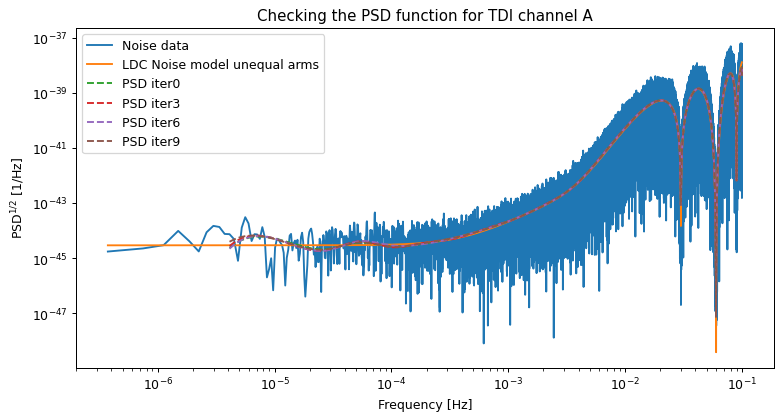

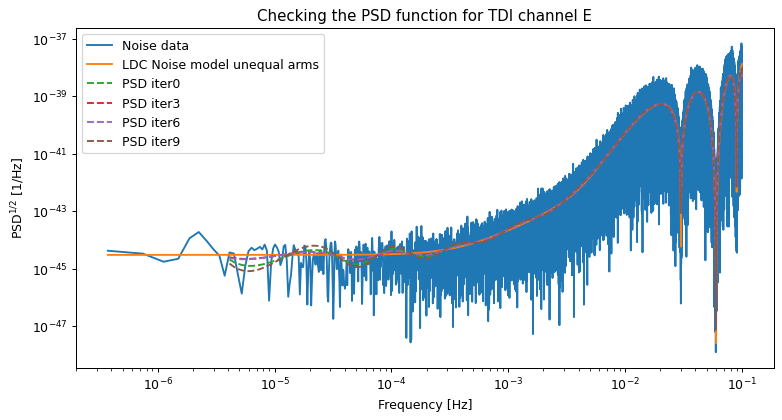

In [67]:
# data imputation with iteration loop
# create empty arrays for the imputation
imp_cls = []
psd_cls = []
y_res = []
# create reconstructed data array with empty A, E, T fields
datang_rec = np.rec.fromarrays([datang['t']]+3*[np.zeros(len(datang['t']))], 
                               names = datang.dtype.names)
# set up flags and variables
names=['A', 'E']
mask = spritzmask['mask']
n_iter = 10
fit_type = 'log_spline'
fit_dof = 15
k = 10
fmin = 1 / t_obs * k
print(' `fmin` value is {:.2e}'.format(fmin))

## initialize imputation
for tdi in names:
    t1 = time.time()
    psd_cls, imp_cls, y_res = create_imputation(datang, tdi, mask, noise_model = 'spritz')
    datang_rec[tdi] = y_res
    # plot PSD vs PSD-0 model
    fig, ax = plt.subplots(1, 1, figsize=(10,5),dpi=90)
    ax.set_title(r"Checking the PSD function for TDI channel "+tdi)
    ax.set_xlabel(r"Frequency [Hz]")
    ax.set_ylabel(r"PSD${}^{1/2}$ [1/Hz]") 
    ax.loglog(psddatang['f'], (psddatang[tdi]), label="Noise data")
    ax.loglog(psd_cls.f[psd_cls.f>0], psd_cls.psd_fn(psd_cls.f[psd_cls.f>0]), label="LDC Noise model unequal arms")
    ax.grid()
    # update imputation
    for i in range(n_iter):
        psdmod, imp_cls, y_res = update_imputation(data_rec = datang_rec, imp_cls = imp_cls, channel = tdi,
                                                  fit_type = fit_type, fit_dof=fit_dof, fmin=fmin)
        datang_rec[tdi] = y_res
        # plot PSD vs PSD-fit models for every iteration
        if (i % 3)==0:
            ax.loglog(psdmod.f[psdmod.f>fmin], (psdmod.psd_fn(psdmod.f[psdmod.f>fmin])), ls='--', label="PSD iter"+str(i))
            ax.legend(loc='upper left')
    t2 = time.time()
    print("Imputation for combination " + tdi + " took " + str(t2-t1))

    ax.legend(loc='best')
    ax.grid()

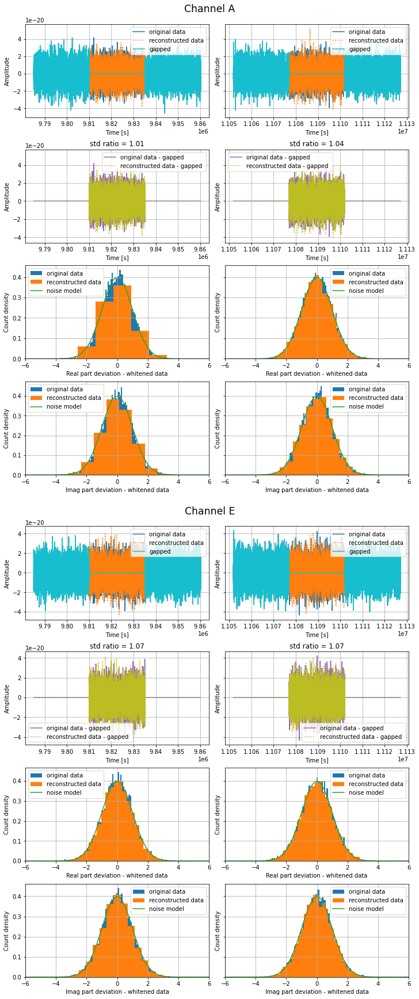

In [68]:
view_gaps(ts = datan['t'],
          ys = [[datan[names] for names in datan.dtype.names[1:]], 
                [datang_rec[names] for names in datan.dtype.names[1:]]],
          yg = [datang[names] for names in datan.dtype.names[1:]],
          maskinfo = spritzmask, channels = ['A', 'E'],
          labels=['original data', 'reconstructed data', 'gapped data'],
          save = False, fname = figname, nwing=5000)

In [69]:
fdatan_rec, psddata_rec, _ = generate_freq_data(datang_rec) 

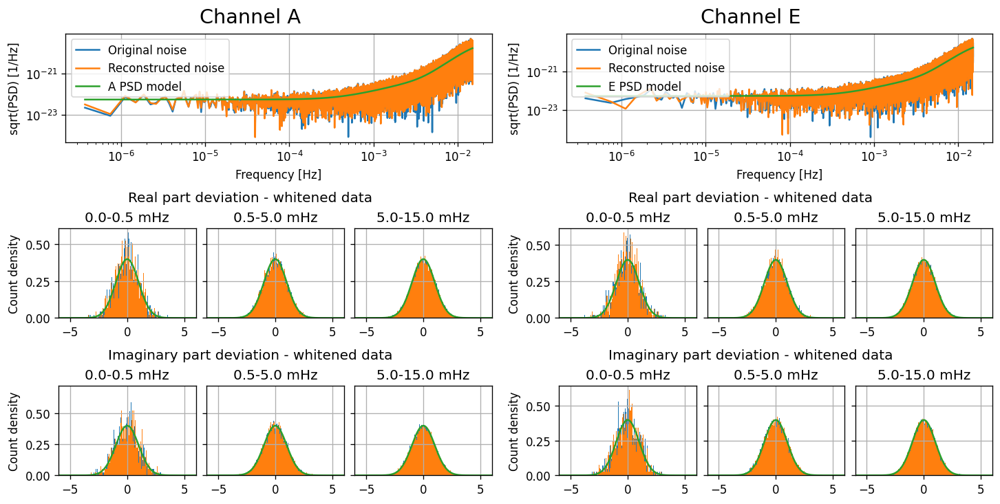

In [70]:
# plot comparison
plot_compare_spectra_timeseries(data = [datan, datang_rec], 
                                freq_bands=[5e-4, 5e-3],
                                fmax = 1.5e-2,
                               labels = ['Original noise', 'Reconstructed noise'], 
                                save = False, fname = figname)

### 5.4 PSD estimated with `fit_type='log_splineratio'`
#### Test 1: `fit_dof=6`, `k_fmin = 1`, `n_iter=10`

 `fmin` value is 3.73e-07
Computation of autocovariance + PSD took 8.542069911956787
Computation of autocovariance + PSD took 0.2591078281402588
Computation of autocovariance + PSD took 0.22369384765625
Computation of autocovariance + PSD took 0.23988103866577148
Computation of autocovariance + PSD took 0.23653411865234375
Computation of autocovariance + PSD took 0.22281789779663086
Computation of autocovariance + PSD took 0.2253260612487793
Computation of autocovariance + PSD took 0.224653959274292
Computation of autocovariance + PSD took 0.22543621063232422
Computation of autocovariance + PSD took 0.22352313995361328
Computation of autocovariance + PSD took 0.23762202262878418
Imputation for combination A took 17.934240102767944
Computation of autocovariance + PSD took 6.440874099731445
Computation of autocovariance + PSD took 0.23081398010253906
Computation of autocovariance + PSD took 0.2407360076904297
Computation of autocovariance + PSD took 0.2344667911529541
Computation of auto

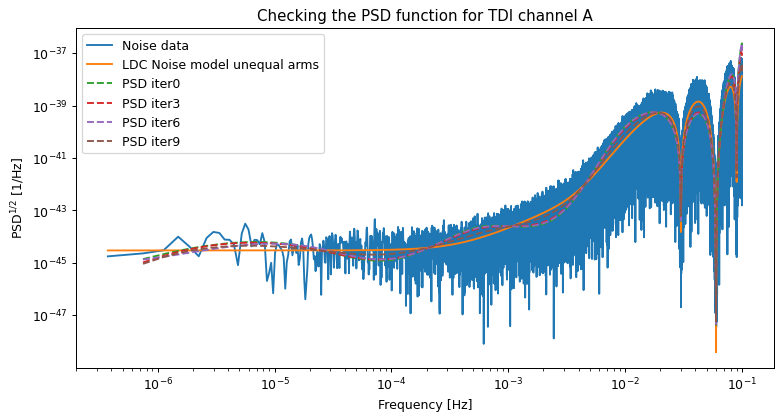

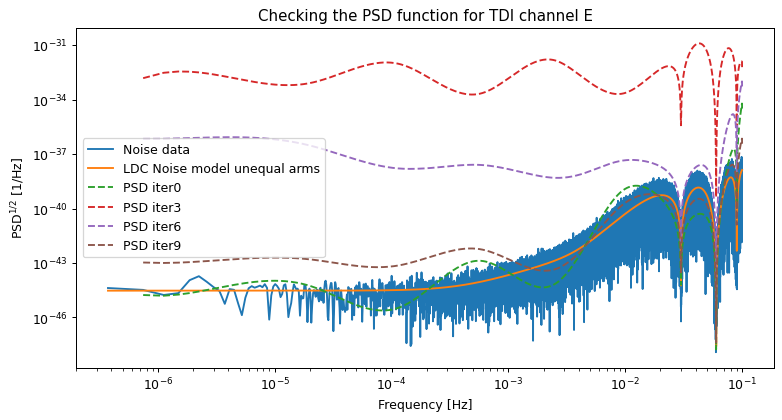

In [71]:
# data imputation with iteration loop
# create empty arrays for the imputation
imp_cls = []
psd_cls = []
y_res = []
# create reconstructed data array with empty A, E, T fields
datang_rec = np.rec.fromarrays([datang['t']]+3*[np.zeros(len(datang['t']))], 
                               names = datang.dtype.names)
# set up flags and variables
names=['A', 'E']
mask = spritzmask['mask']
n_iter = 10
fit_type = 'logratio_spline'
fit_dof = 6
k = 1
fmin = 1 / t_obs * k
print(' `fmin` value is {:.2e}'.format(fmin))

## initialize imputation
for tdi in names:
    t1 = time.time()
    psd_cls, imp_cls, y_res = create_imputation(datang, tdi, mask, noise_model = 'spritz')
    datang_rec[tdi] = y_res
    # plot PSD vs PSD-0 model
    fig, ax = plt.subplots(1, 1, figsize=(10,5),dpi=90)
    ax.set_title(r"Checking the PSD function for TDI channel "+tdi)
    ax.set_xlabel(r"Frequency [Hz]")
    ax.set_ylabel(r"PSD${}^{1/2}$ [1/Hz]") 
    ax.loglog(psddatang['f'], (psddatang[tdi]), label="Noise data")
    ax.loglog(psd_cls.f[psd_cls.f>0], psd_cls.psd_fn(psd_cls.f[psd_cls.f>0]), label="LDC Noise model unequal arms")
    ax.grid()
    # update imputation
    for i in range(n_iter):
        psdmod, imp_cls, y_res = update_imputation(data_rec = datang_rec, imp_cls = imp_cls, channel = tdi,
                                                  fit_type = fit_type, fit_dof=fit_dof, fmin=fmin)
        datang_rec[tdi] = y_res
        # plot PSD vs PSD-fit models for every iteration
        if (i % 3)==0:
            ax.loglog(psdmod.f[psdmod.f>fmin], (psdmod.psd_fn(psdmod.f[psdmod.f>fmin])), ls='--', label="PSD iter"+str(i))
            ax.legend(loc='upper left')
    t2 = time.time()
    print("Imputation for combination " + tdi + " took " + str(t2-t1))

    ax.legend(loc='best')
    ax.grid()

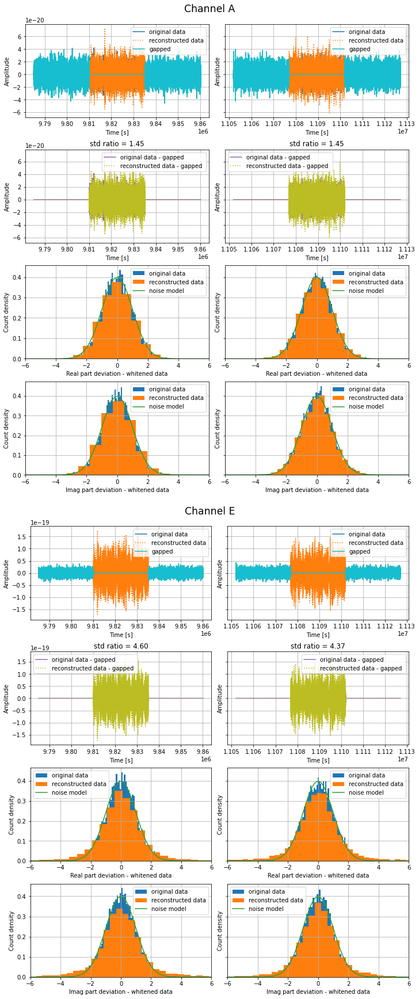

In [72]:
view_gaps(ts = datan['t'],
          ys = [[datan[names] for names in datan.dtype.names[1:]], 
                [datang_rec[names] for names in datan.dtype.names[1:]]],
          yg = [datang[names] for names in datan.dtype.names[1:]],
          maskinfo = spritzmask, channels = ['A', 'E'],
          labels=['original data', 'reconstructed data', 'gapped data'],
          save = False, fname = figname, nwing=5000)

In [73]:
fdatan_rec, psddata_rec, _ = generate_freq_data(datang_rec) 

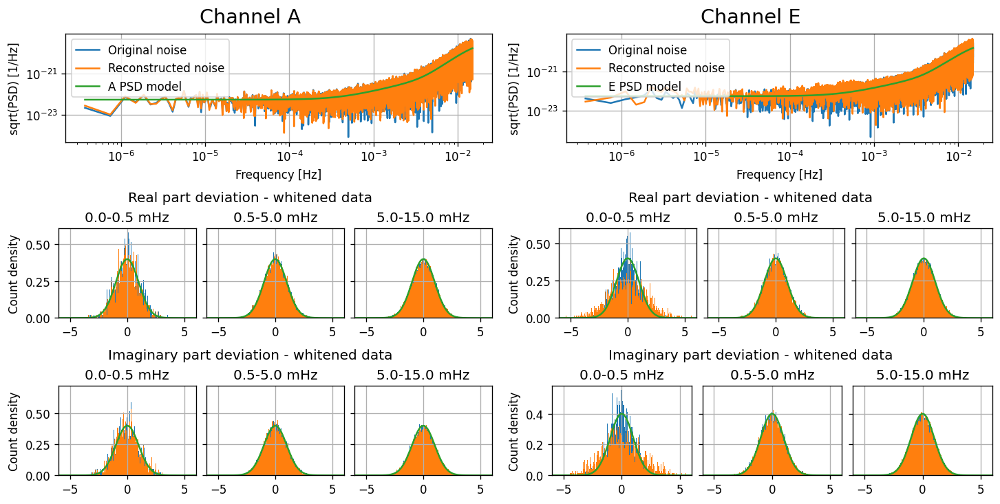

In [74]:
# plot comparison
plot_compare_spectra_timeseries(data = [datan, datang_rec], 
                                freq_bands=[5e-4, 5e-3],
                                fmax = 1.5e-2,
                               labels = ['Original noise', 'Reconstructed noise'], 
                                save = False, fname = figname)

#### Test 2: `fit_dof=15`, `k_fmin = 5`, `n_iter=10`

 `fmin` value is 1.87e-06
Computation of autocovariance + PSD took 7.078480243682861
Computation of autocovariance + PSD took 0.25190019607543945
Computation of autocovariance + PSD took 0.24792885780334473
Computation of autocovariance + PSD took 0.2437758445739746
Computation of autocovariance + PSD took 0.22726798057556152
Computation of autocovariance + PSD took 0.2550511360168457
Computation of autocovariance + PSD took 0.25830984115600586
Computation of autocovariance + PSD took 0.24111509323120117
Computation of autocovariance + PSD took 0.24157500267028809
Computation of autocovariance + PSD took 0.24958491325378418
Computation of autocovariance + PSD took 0.23877191543579102
Imputation for combination A took 16.907081842422485
Computation of autocovariance + PSD took 7.39863133430481
Computation of autocovariance + PSD took 0.29558396339416504
Computation of autocovariance + PSD took 0.24423718452453613
Computation of autocovariance + PSD took 0.24626588821411133
Computation o

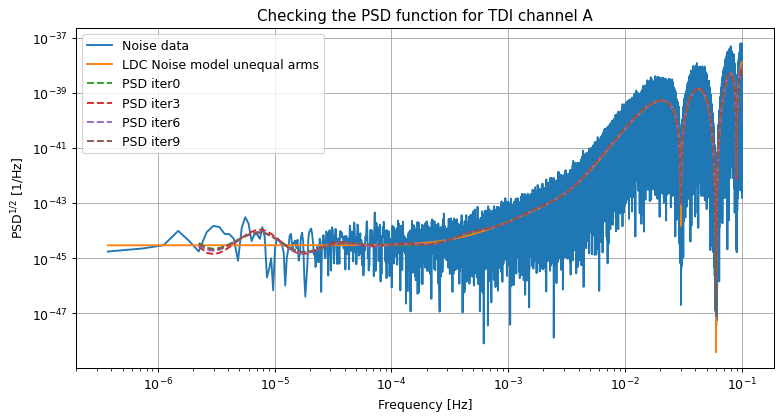

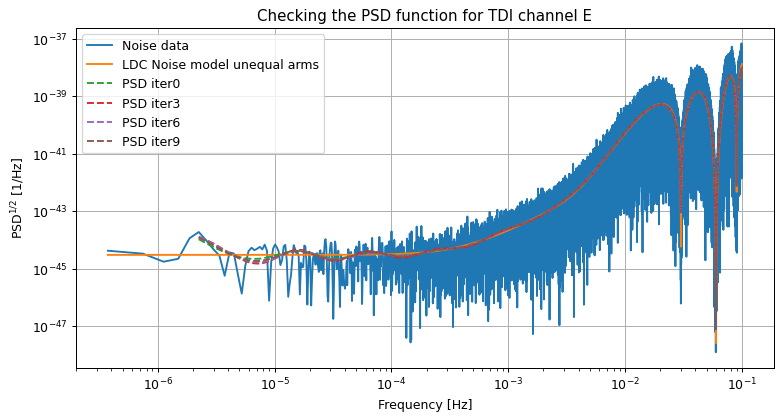

In [75]:
# data imputation with iteration loop
# create empty arrays for the imputation
imp_cls = []
psd_cls = []
y_res = []
# create reconstructed data array with empty A, E, T fields
datang_rec = np.rec.fromarrays([datang['t']]+3*[np.zeros(len(datang['t']))], 
                               names = datang.dtype.names)
# set up flags and variables
names=['A', 'E']
mask = spritzmask['mask']
n_iter = 10
fit_type = 'logratio_spline'
fit_dof = 15
k = 5
fmin = 1 / t_obs * k
print(' `fmin` value is {:.2e}'.format(fmin))

## initialize imputation
for tdi in names:
    t1 = time.time()
    psd_cls, imp_cls, y_res = create_imputation(datang, tdi, mask, noise_model = 'spritz')
    datang_rec[tdi] = y_res
    # plot PSD vs PSD-0 model
    fig, ax = plt.subplots(1, 1, figsize=(10,5),dpi=90)
    ax.set_title(r"Checking the PSD function for TDI channel "+tdi)
    ax.set_xlabel(r"Frequency [Hz]")
    ax.set_ylabel(r"PSD${}^{1/2}$ [1/Hz]") 
    ax.loglog(psddatang['f'], (psddatang[tdi]), label="Noise data")
    ax.loglog(psd_cls.f[psd_cls.f>0], psd_cls.psd_fn(psd_cls.f[psd_cls.f>0]), label="LDC Noise model unequal arms")
    ax.grid()
    # update imputation
    for i in range(n_iter):
        psdmod, imp_cls, y_res = update_imputation(data_rec = datang_rec, imp_cls = imp_cls, channel = tdi,
                                                  fit_type = fit_type, fit_dof=fit_dof, fmin=fmin)
        datang_rec[tdi] = y_res
        # plot PSD vs PSD-fit models for every iteration
        if (i % 3)==0:
            ax.loglog(psdmod.f[psdmod.f>fmin], (psdmod.psd_fn(psdmod.f[psdmod.f>fmin])), ls='--', label="PSD iter"+str(i))
            ax.legend(loc='upper left')
    t2 = time.time()
    print("Imputation for combination " + tdi + " took " + str(t2-t1))

    ax.legend(loc='best')
ax.grid()
ax.grid()

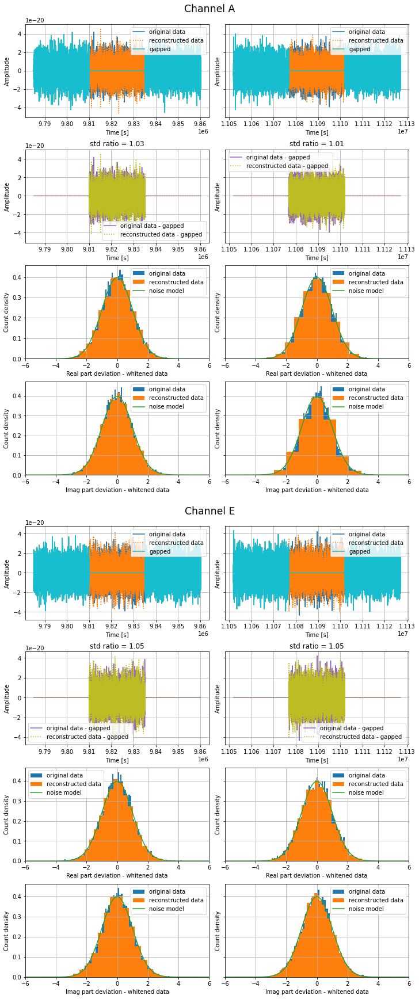

In [76]:
view_gaps(ts = datan['t'],
          ys = [[datan[names] for names in datan.dtype.names[1:]], 
                [datang_rec[names] for names in datan.dtype.names[1:]]],
          yg = [datang[names] for names in datan.dtype.names[1:]],
          maskinfo = spritzmask, channels = ['A', 'E'],
          labels=['original data', 'reconstructed data', 'gapped data'],
          save = False, fname = figname, nwing=5000)

In [77]:
fdatan_rec, psddata_rec, _ = generate_freq_data(datang_rec) 

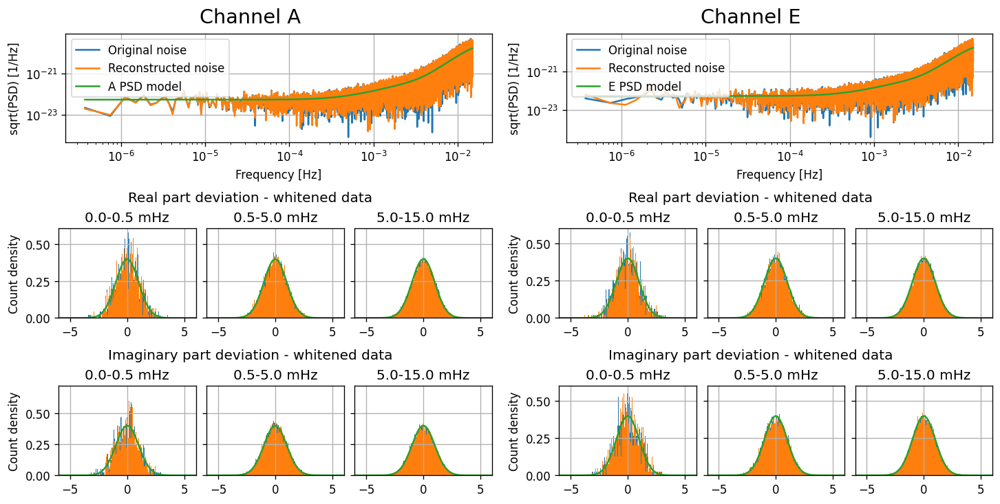

In [78]:
# plot comparison
plot_compare_spectra_timeseries(data = [datan, datang_rec], 
                                freq_bands=[5e-4, 5e-3],
                                fmax = 1.5e-2,
                               labels = ['Original noise', 'Reconstructed noise'], 
                                save = False, fname = figname)

#### Test 3: `fit_dof=30`, `k_fmin = 5`, `n_iter=10`

 `fmin` value is 1.87e-06
Computation of autocovariance + PSD took 7.160928010940552
Computation of autocovariance + PSD took 0.24252104759216309
Computation of autocovariance + PSD took 0.24238896369934082
Computation of autocovariance + PSD took 0.23293495178222656
Computation of autocovariance + PSD took 0.24457025527954102
Computation of autocovariance + PSD took 0.2380208969116211
Computation of autocovariance + PSD took 0.23402190208435059
Computation of autocovariance + PSD took 0.24300122261047363
Computation of autocovariance + PSD took 0.24589014053344727
Computation of autocovariance + PSD took 0.23630118370056152
Computation of autocovariance + PSD took 0.24761295318603516
Imputation for combination A took 16.96589684486389
Computation of autocovariance + PSD took 6.6961729526519775
Computation of autocovariance + PSD took 0.23947501182556152
Computation of autocovariance + PSD took 0.23917531967163086
Computation of autocovariance + PSD took 0.24876999855041504
Computation

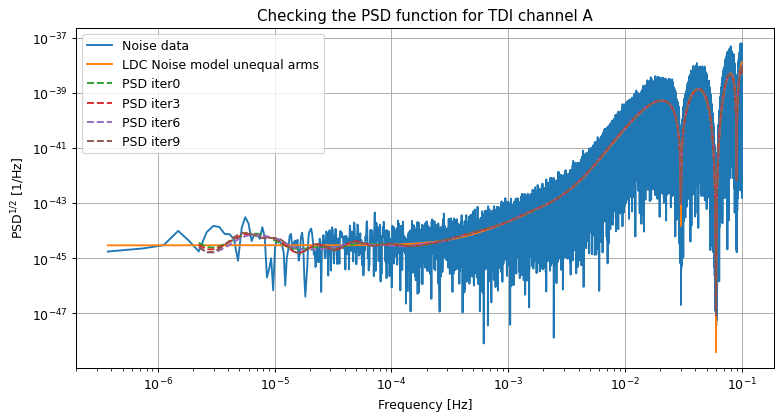

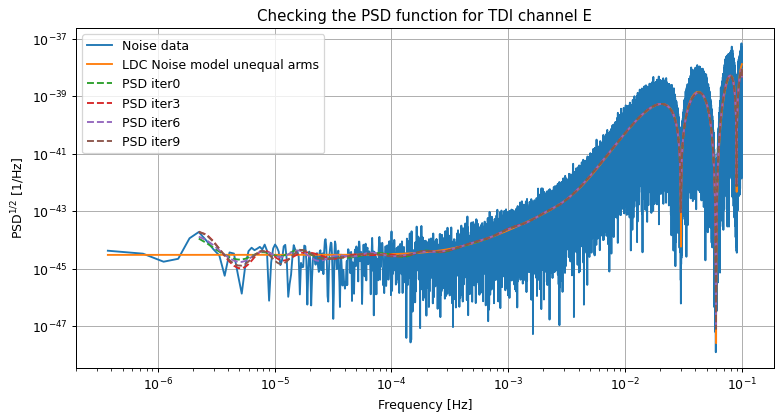

In [79]:
# data imputation with iteration loop
# create empty arrays for the imputation
imp_cls = []
psd_cls = []
y_res = []
# create reconstructed data array with empty A, E, T fields
datang_rec = np.rec.fromarrays([datang['t']]+3*[np.zeros(len(datang['t']))], 
                               names = datang.dtype.names)
# set up flags and variables
names=['A', 'E']
mask = spritzmask['mask']
n_iter = 10
fit_type = 'logratio_spline'
fit_dof = 30
k = 5
fmin = 1 / t_obs * k
print(' `fmin` value is {:.2e}'.format(fmin))

## initialize imputation
for tdi in names:
    t1 = time.time()
    psd_cls, imp_cls, y_res = create_imputation(datang, tdi, mask, noise_model = 'spritz')
    datang_rec[tdi] = y_res
    # plot PSD vs PSD-0 model
    fig, ax = plt.subplots(1, 1, figsize=(10,5),dpi=90)
    ax.set_title(r"Checking the PSD function for TDI channel "+tdi)
    ax.set_xlabel(r"Frequency [Hz]")
    ax.set_ylabel(r"PSD${}^{1/2}$ [1/Hz]") 
    ax.loglog(psddatang['f'], (psddatang[tdi]), label="Noise data")
    ax.loglog(psd_cls.f[psd_cls.f>0], psd_cls.psd_fn(psd_cls.f[psd_cls.f>0]), label="LDC Noise model unequal arms")
    ax.grid()
    # update imputation
    for i in range(n_iter):
        psdmod, imp_cls, y_res = update_imputation(data_rec = datang_rec, imp_cls = imp_cls, channel = tdi,
                                                  fit_type = fit_type, fit_dof=fit_dof, fmin=fmin)
        datang_rec[tdi] = y_res
        # plot PSD vs PSD-fit models for every iteration
        if (i % 3)==0:
            ax.loglog(psdmod.f[psdmod.f>fmin], (psdmod.psd_fn(psdmod.f[psdmod.f>fmin])), ls='--', label="PSD iter"+str(i))
            ax.legend(loc='upper left')
    t2 = time.time()
    print("Imputation for combination " + tdi + " took " + str(t2-t1))

    ax.legend(loc='best')
ax.grid()
ax.grid()

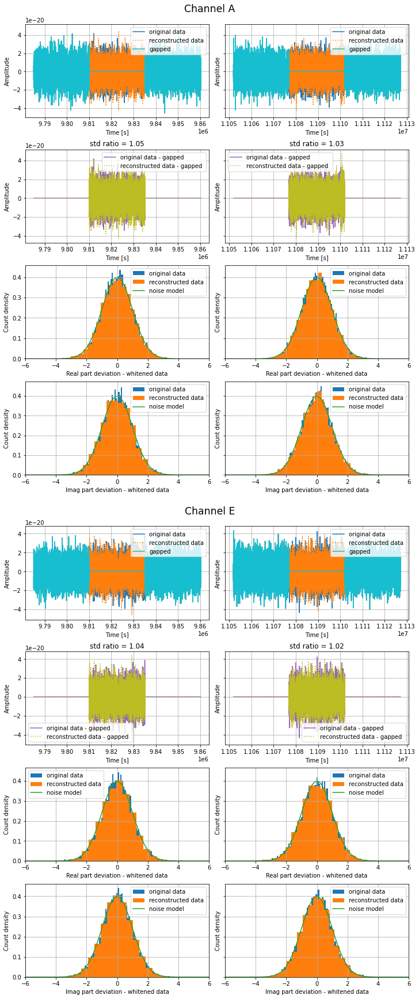

In [80]:
view_gaps(ts = datan['t'],
          ys = [[datan[names] for names in datan.dtype.names[1:]], 
                [datang_rec[names] for names in datan.dtype.names[1:]]],
          yg = [datang[names] for names in datan.dtype.names[1:]],
          maskinfo = spritzmask, channels = ['A', 'E'],
          labels=['original data', 'reconstructed data', 'gapped data'],
          save = False, fname = figname, nwing=5000)

In [81]:
fdatan_rec, psddata_rec, _ = generate_freq_data(datang_rec) 

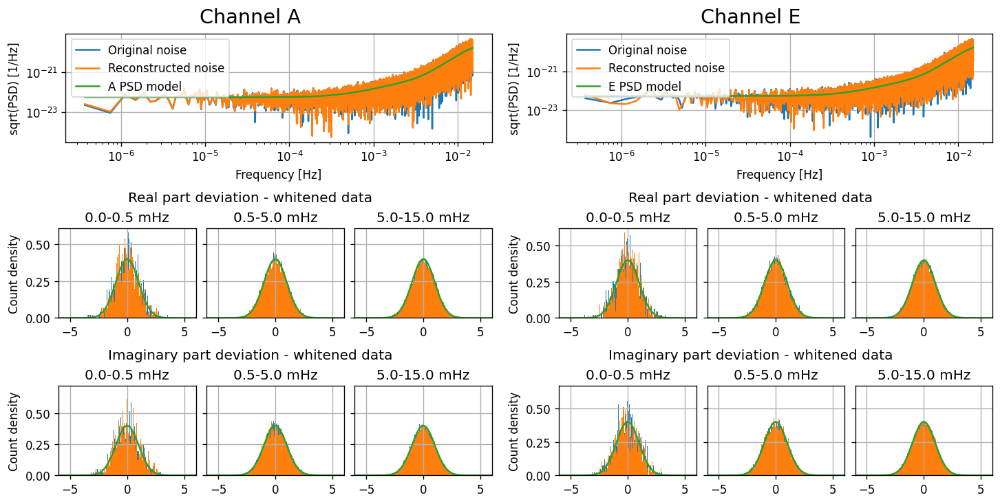

In [82]:
# plot comparison
plot_compare_spectra_timeseries(data = [datan, datang_rec], 
                                freq_bands=[5e-4, 5e-3],
                                fmax = 1.5e-2,
                               labels = ['Original noise', 'Reconstructed noise'], 
                                save = False, fname = figname)

#### Test 3: `fit_dof=15`, `k_fmin = 10`, `n_iter=10`

 `fmin` value is 3.73e-06
Computation of autocovariance + PSD took 8.222474098205566
Computation of autocovariance + PSD took 0.24473285675048828
Computation of autocovariance + PSD took 0.22521686553955078
Computation of autocovariance + PSD took 0.24367594718933105
Computation of autocovariance + PSD took 0.23389697074890137
Computation of autocovariance + PSD took 0.2363729476928711
Computation of autocovariance + PSD took 0.23494386672973633
Computation of autocovariance + PSD took 0.23974084854125977
Computation of autocovariance + PSD took 0.23148488998413086
Computation of autocovariance + PSD took 0.22843074798583984
Computation of autocovariance + PSD took 0.23325681686401367
Imputation for combination A took 17.820930004119873
Computation of autocovariance + PSD took 6.632596969604492
Computation of autocovariance + PSD took 0.22887086868286133
Computation of autocovariance + PSD took 0.2410290241241455
Computation of autocovariance + PSD took 0.24109292030334473
Computation 

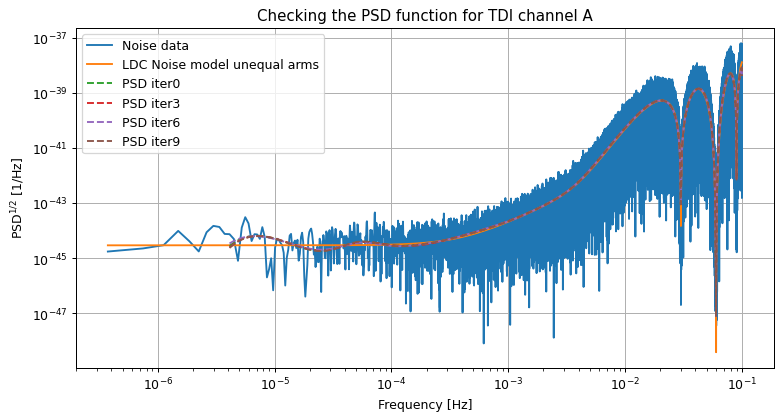

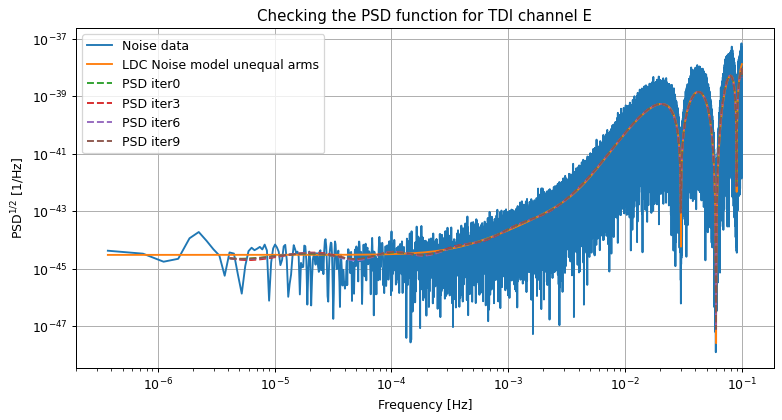

In [83]:
# data imputation with iteration loop
# create empty arrays for the imputation
imp_cls = []
psd_cls = []
y_res = []
# create reconstructed data array with empty A, E, T fields
datang_rec = np.rec.fromarrays([datang['t']]+3*[np.zeros(len(datang['t']))], 
                               names = datang.dtype.names)
# set up flags and variables
names=['A', 'E']
mask = spritzmask['mask']
n_iter = 10
fit_type = 'logratio_spline'
fit_dof = 15
k = 10
fmin = 1 / t_obs * k
print(' `fmin` value is {:.2e}'.format(fmin))

## initialize imputation
for tdi in names:
    t1 = time.time()
    psd_cls, imp_cls, y_res = create_imputation(datang, tdi, mask, noise_model = 'spritz')
    datang_rec[tdi] = y_res
    # plot PSD vs PSD-0 model
    fig, ax = plt.subplots(1, 1, figsize=(10,5),dpi=90)
    ax.set_title(r"Checking the PSD function for TDI channel "+tdi)
    ax.set_xlabel(r"Frequency [Hz]")
    ax.set_ylabel(r"PSD${}^{1/2}$ [1/Hz]") 
    ax.loglog(psddatang['f'], (psddatang[tdi]), label="Noise data")
    ax.loglog(psd_cls.f[psd_cls.f>0], psd_cls.psd_fn(psd_cls.f[psd_cls.f>0]), label="LDC Noise model unequal arms")
    ax.grid()
    # update imputation
    for i in range(n_iter):
        psdmod, imp_cls, y_res = update_imputation(data_rec = datang_rec, imp_cls = imp_cls, channel = tdi,
                                                  fit_type = fit_type, fit_dof=fit_dof, fmin=fmin)
        datang_rec[tdi] = y_res
        # plot PSD vs PSD-fit models for every iteration
        if (i % 3)==0:
            ax.loglog(psdmod.f[psdmod.f>fmin], (psdmod.psd_fn(psdmod.f[psdmod.f>fmin])), ls='--', label="PSD iter"+str(i))
            ax.legend(loc='upper left')
    t2 = time.time()
    print("Imputation for combination " + tdi + " took " + str(t2-t1))

    ax.legend(loc='best')
ax.grid()
ax.grid()

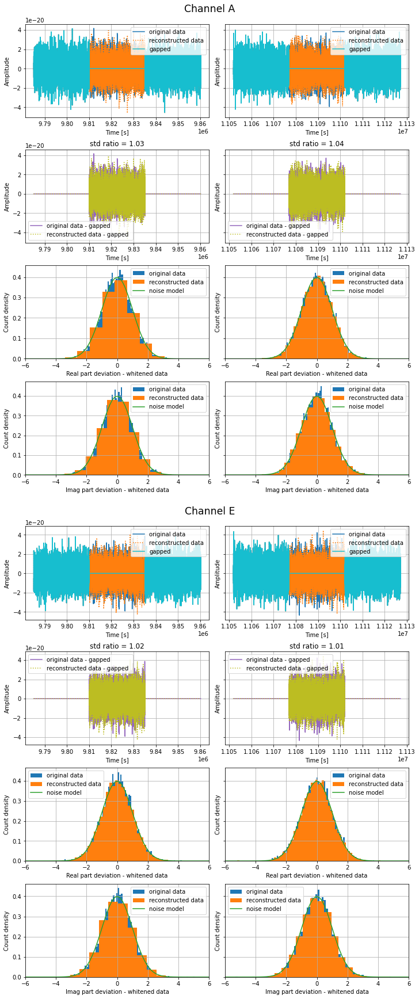

In [84]:
view_gaps(ts = datan['t'],
          ys = [[datan[names] for names in datan.dtype.names[1:]], 
                [datang_rec[names] for names in datan.dtype.names[1:]]],
          yg = [datang[names] for names in datan.dtype.names[1:]],
          maskinfo = spritzmask, channels = ['A', 'E'],
          labels=['original data', 'reconstructed data', 'gapped data'],
          save = False, fname = figname, nwing=5000)

In [85]:
fdatan_rec, psddata_rec, _ = generate_freq_data(datang_rec) 

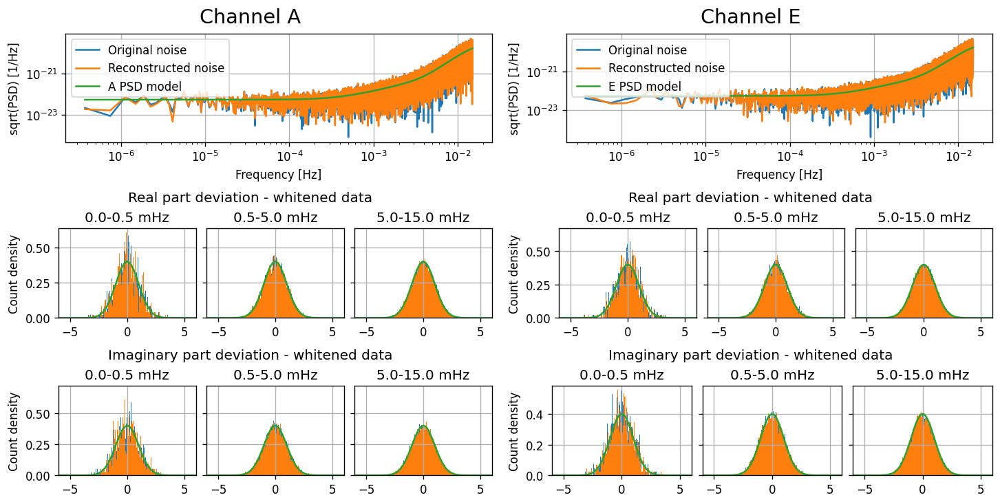

In [86]:
# plot comparison
plot_compare_spectra_timeseries(data = [datan, datang_rec], 
                                freq_bands=[5e-4, 5e-3],
                                fmax = 1.5e-2,
                               labels = ['Original noise', 'Reconstructed noise'], 
                                save = False, fname = figname)

#### Test 4: `fit_dof = 30`, `k_fmin = 30`, `n_iter = 10`

 `fmin` value is 1.12e-05
Computation of autocovariance + PSD took 6.421987056732178
Computation of autocovariance + PSD took 0.2395319938659668
Computation of autocovariance + PSD took 0.24298310279846191
Computation of autocovariance + PSD took 0.23858380317687988
Computation of autocovariance + PSD took 0.22313284873962402
Computation of autocovariance + PSD took 0.23382091522216797
Computation of autocovariance + PSD took 0.2283029556274414
Computation of autocovariance + PSD took 0.22620487213134766
Computation of autocovariance + PSD took 0.23712611198425293
Computation of autocovariance + PSD took 0.24923181533813477
Computation of autocovariance + PSD took 0.22795486450195312
Imputation for combination A took 16.098439931869507
Computation of autocovariance + PSD took 6.413416862487793
Computation of autocovariance + PSD took 0.23973608016967773
Computation of autocovariance + PSD took 0.2597208023071289
Computation of autocovariance + PSD took 0.2475578784942627
Computation of

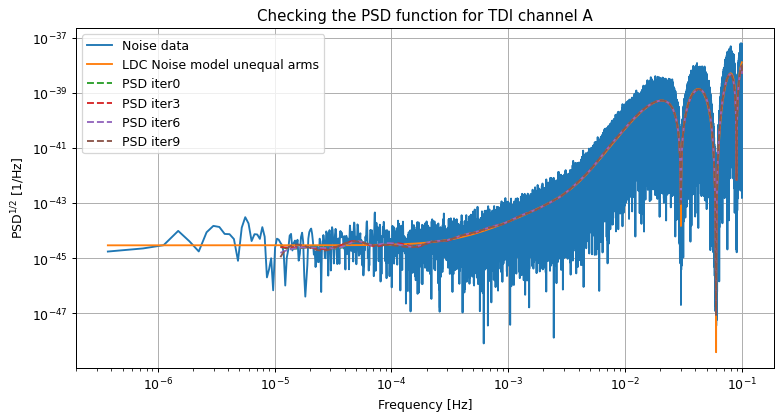

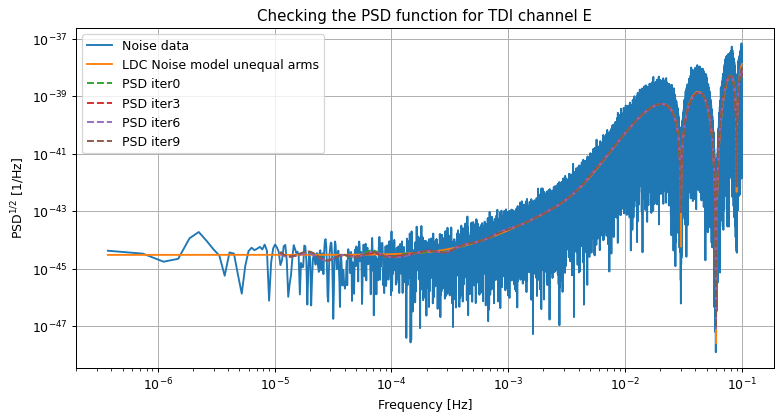

In [107]:
# data imputation with iteration loop
# create empty arrays for the imputation
imp_cls = []
psd_cls = []
y_res = []
# create reconstructed data array with empty A, E, T fields
datang_rec = np.rec.fromarrays([datang['t']]+3*[np.zeros(len(datang['t']))], 
                               names = datang.dtype.names)
# set up flags and variables
names=['A', 'E']
mask = spritzmask['mask']
n_iter = 10
fit_type = 'logratio_spline'
fit_dof = 30
k = 30
fmin = 1 / t_obs * k
print(' `fmin` value is {:.2e}'.format(fmin))

## initialize imputation
for tdi in names:
    t1 = time.time()
    psd_cls, imp_cls, y_res = create_imputation(datang, tdi, mask, noise_model = 'spritz')
    datang_rec[tdi] = y_res
    # plot PSD vs PSD-0 model
    fig, ax = plt.subplots(1, 1, figsize=(10,5),dpi=90)
    ax.set_title(r"Checking the PSD function for TDI channel "+tdi)
    ax.set_xlabel(r"Frequency [Hz]")
    ax.set_ylabel(r"PSD${}^{1/2}$ [1/Hz]") 
    ax.loglog(psddatang['f'], (psddatang[tdi]), label="Noise data")
    ax.loglog(psd_cls.f[psd_cls.f>0], psd_cls.psd_fn(psd_cls.f[psd_cls.f>0]), label="LDC Noise model unequal arms")
    ax.grid()
    # update imputation
    for i in range(n_iter):
        psdmod, imp_cls, y_res = update_imputation(data_rec = datang_rec, imp_cls = imp_cls, channel = tdi,
                                                  fit_type = fit_type, fit_dof=fit_dof, fmin=fmin)
        datang_rec[tdi] = y_res
        # plot PSD vs PSD-fit models for every iteration
        if (i % 3)==0:
            ax.loglog(psdmod.f[psdmod.f>fmin], (psdmod.psd_fn(psdmod.f[psdmod.f>fmin])), ls='--', label="PSD iter"+str(i))
            ax.legend(loc='upper left')
    t2 = time.time()
    print("Imputation for combination " + tdi + " took " + str(t2-t1))

    ax.legend(loc='best')
ax.grid()
ax.grid()

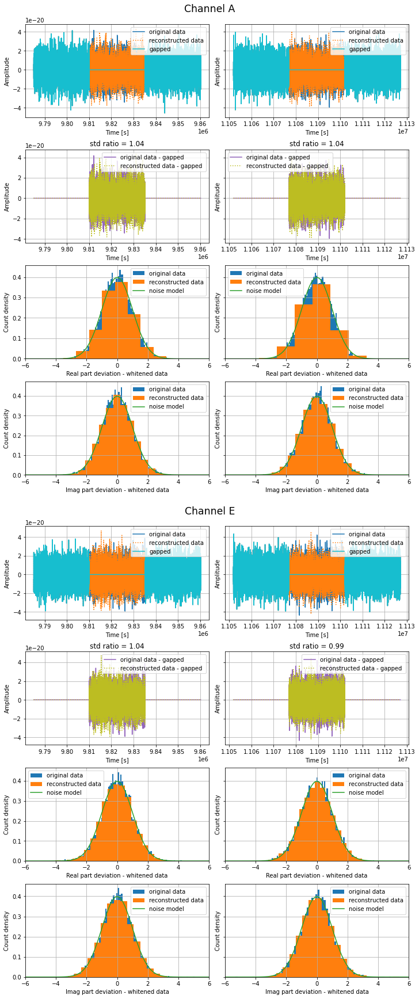

In [108]:
view_gaps(ts = datan['t'],
          ys = [[datan[names] for names in datan.dtype.names[1:]], 
                [datang_rec[names] for names in datan.dtype.names[1:]]],
          yg = [datang[names] for names in datan.dtype.names[1:]],
          maskinfo = spritzmask, channels = ['A', 'E'],
          labels=['original data', 'reconstructed data', 'gapped data'],
          save = False, fname = figname, nwing=5000)

In [109]:
fdatan_rec, psddata_rec, _ = generate_freq_data(datang_rec) 

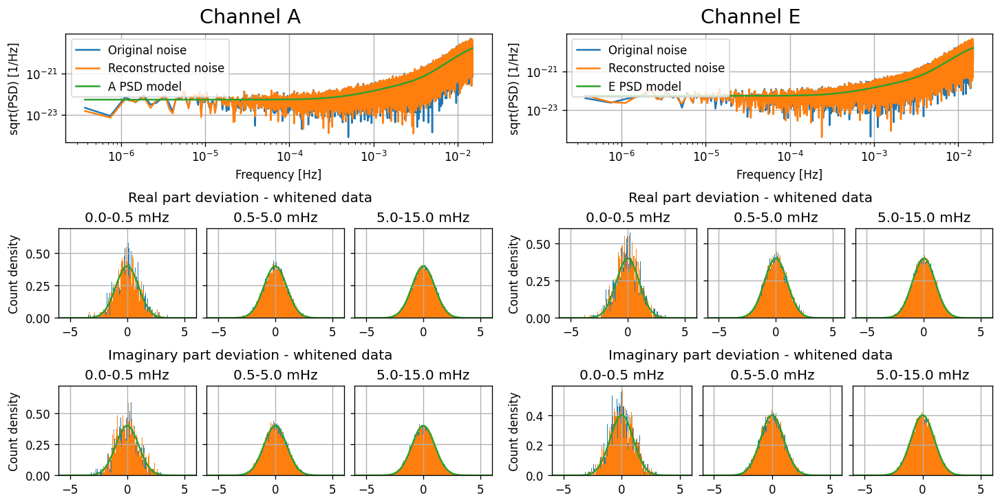

In [110]:
# plot comparison
plot_compare_spectra_timeseries(data = [datan, datang_rec], 
                                freq_bands=[5e-4, 5e-3],
                                fmax = 1.5e-2,
                               labels = ['Original noise', 'Reconstructed noise'], 
                                save = False, fname = figname)